# 颜色特征提取

## 1. 颜色直方图（Color Histogram）

颜色直方图是图像检索和图像分类中最常用的颜色特征提取方法之一。它通过统计图像中每个颜色通道的像素分布情况来描述图像的颜色特征。

### 知识点梳理

**1. 颜色直方图的基本原理**
- **定义**：颜色直方图统计图像中每个颜色通道的像素值分布
- **优点**：
  - 计算简单高效
  - 对图像的旋转、缩放具有较好的鲁棒性
  - 对图像中的小部分遮挡不敏感
- **缺点**：
  - 丢失了颜色的空间位置信息
  - 对光照变化敏感
  - 可能不同的图像产生相似的直方图

**2. 直方图的参数选择**
- **bins数量**：决定了直方图的粒度
  - bins过少（如8）：特征太粗糙，区分度低
  - bins过多（如256）：特征太细致，计算量大，且对噪声敏感
  - 常用值：16、32、64
- **归一化**：通常需要归一化直方图，使其成为概率分布，便于比较不同尺寸的图像

**3. RGB颜色空间的局限性**
- RGB对光照变化敏感
- 颜色信息（色调、饱和度）和亮度信息混合在一起
- 在光照不均或阴影情况下效果不佳

通道1数据形状: torch.Size([148225])
通道1直方图形状: torch.Size([32])
通道2数据形状: torch.Size([148225])
通道2直方图形状: torch.Size([32])
通道3数据形状: torch.Size([148225])
通道3直方图形状: torch.Size([32])
颜色直方图形状: torch.Size([3, 32])


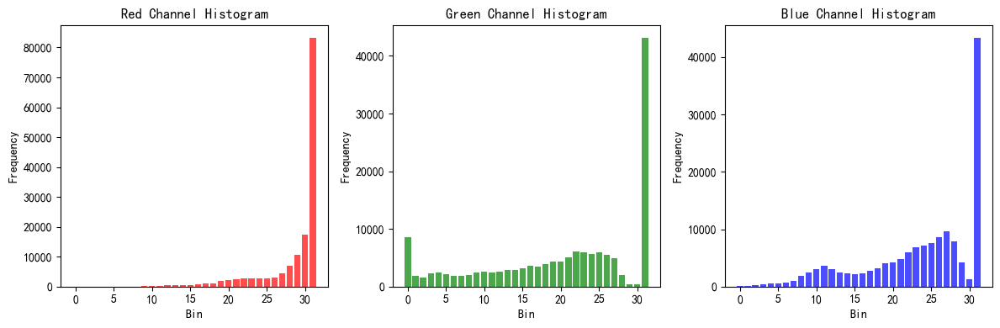

In [12]:
import torch
import torchvision.transforms as transforms
from torchvision.io import read_image
import matplotlib.pyplot as plt
import numpy as np
#设置支持中文的字体
plt.rcParams['font.sans-serif'] = ['SimHei']  # 设置中文字体
plt.rcParams['axes.unicode_minus'] = False    # 解决负号显示问题

 
# 读取图像
img = read_image('./image.png').float() / 255.0  # [3, H, W]

# 计算RGB颜色直方图
def color_histogram(img, bins=32):
    """
    计算RGB颜色直方图
    
    参数:
        img: torch.Tensor, 形状为 [3, H, W] 的归一化图像 (值域[0,1])
        bins: int, 直方图的bin数量，默认32
    
    返回:
        torch.Tensor, 形状为 [3, bins] 的直方图矩阵
    """
    histograms = []
    for channel in range(3):  # R, G, B
        channel_data = img[channel].flatten()  # 展平为一维数组
        print(f"通道{channel+1}数据形状: {channel_data.shape}")
        hist = torch.histc(channel_data, bins=bins, min=0, max=1)  # 计算直方图
        print(f"通道{channel+1}直方图形状: {hist.shape}")
        histograms.append(hist)
    return torch.stack(histograms)

# 应用示例
hist = color_histogram(img)
print(f"颜色直方图形状: {hist.shape}")  # [3, 32]

# 可视化
plt.figure(figsize=(12, 4))
colors = ['red', 'green', 'blue']
for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.bar(range(32), hist[i].numpy(), color=colors[i], alpha=0.7)
    plt.title(f'{colors[i].title()} Channel Histogram')
    plt.xlabel('Bin')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

通道1数据形状: torch.Size([148225])
通道1直方图形状: torch.Size([32])
通道2数据形状: torch.Size([148225])
通道2直方图形状: torch.Size([32])
通道3数据形状: torch.Size([148225])
通道3直方图形状: torch.Size([32])
归一化直方图总和（每个通道）: tensor([1., 1., 1.])


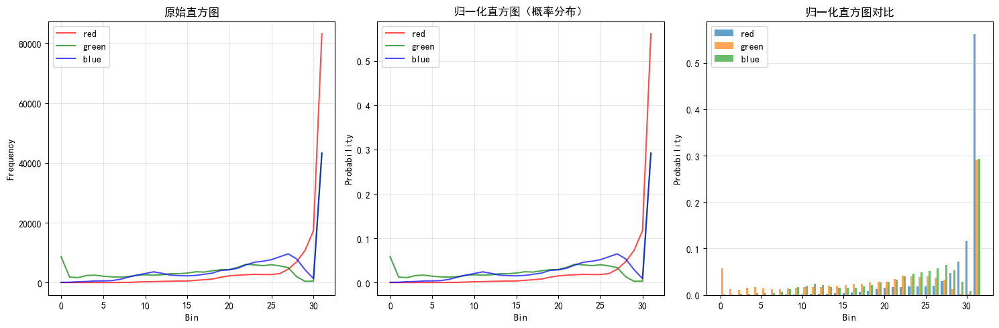

In [13]:
# 归一化直方图（归一化为概率分布）
def normalized_color_histogram(img, bins=32):
    """计算归一化的颜色直方图"""
    hist = color_histogram(img, bins)
    # 归一化：每个通道的直方图除以总像素数
    total_pixels = img.shape[1] * img.shape[2]
    hist_normalized = hist / total_pixels
    return hist_normalized

# 计算归一化直方图
hist_norm = normalized_color_histogram(img)
print(f"归一化直方图总和（每个通道）: {hist_norm.sum(dim=1)}")  # 应该接近1.0

# 可视化对比
plt.figure(figsize=(15, 5))

# 原始直方图
plt.subplot(1, 3, 1)
for i, color in enumerate(['red', 'green', 'blue']):
    plt.plot(hist[i].numpy(), color=color, alpha=0.7, label=color)
plt.title('原始直方图')
plt.xlabel('Bin')
plt.ylabel('Frequency')
plt.legend()
plt.grid(alpha=0.3)

# 归一化直方图
plt.subplot(1, 3, 2)
for i, color in enumerate(['red', 'green', 'blue']):
    plt.plot(hist_norm[i].numpy(), color=color, alpha=0.7, label=color)
plt.title('归一化直方图（概率分布）')
plt.xlabel('Bin')
plt.ylabel('Probability')
plt.legend()
plt.grid(alpha=0.3)

# 堆叠柱状图
plt.subplot(1, 3, 3)
x = np.arange(32)
width = 0.25
for i, color in enumerate(['red', 'green', 'blue']):
    plt.bar(x + i*width, hist_norm[i].numpy(), width, label=color, alpha=0.7)
plt.title('归一化直方图对比')
plt.xlabel('Bin')
plt.ylabel('Probability')
plt.legend()
plt.grid(alpha=0.3, axis='y')

plt.tight_layout()
plt.show()


## 2. HSV颜色空间直方图

HSV（Hue色调, Saturation饱和度, Value明度）颜色空间更符合人类对颜色的感知，在图像检索中通常效果更好。HSV空间将颜色信息和亮度信息分离，对光照变化具有更好的鲁棒性。


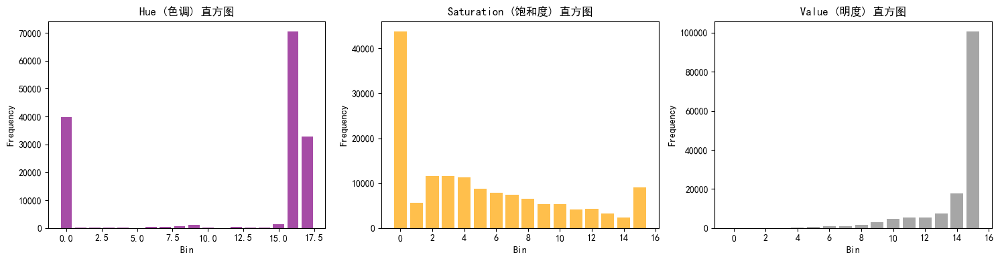

In [14]:
# HSV颜色空间直方图
try:
    import cv2
    HAS_CV2 = True
except ImportError:
    print("OpenCV未安装，使用numpy实现HSV转换")
    HAS_CV2 = False

def rgb_to_hsv(rgb_img):
    """将RGB图像转换为HSV"""
    # rgb_img: [3, H, W], 值域[0, 1]
    if HAS_CV2:
        rgb_np = rgb_img.permute(1, 2, 0).numpy()  # [H, W, 3]
        rgb_uint8 = (rgb_np * 255).astype(np.uint8)
        hsv_uint8 = cv2.cvtColor(rgb_uint8, cv2.COLOR_RGB2HSV)
        hsv = hsv_uint8.astype(np.float32)
        hsv[:, :, 0] /= 180.0  # H: [0, 180] -> [0, 1]
        hsv[:, :, 1:] /= 255.0  # S, V: [0, 255] -> [0, 1]
        return torch.from_numpy(hsv).permute(2, 0, 1)  # [3, H, W]
    else:
        # 使用numpy手动实现（简化版）
        rgb_np = rgb_img.permute(1, 2, 0).numpy()
        hsv_np = np.zeros_like(rgb_np)
        # 这里简化处理，实际应用建议安装OpenCV
        print("警告：使用简化的HSV转换，建议安装OpenCV")
        return torch.from_numpy(rgb_np).permute(2, 0, 1)

def hsv_histogram(img, h_bins=18, s_bins=16, v_bins=16):
    """
    计算HSV颜色直方图
    
    参数:
        img: RGB图像 [3, H, W]
        h_bins, s_bins, v_bins: 各通道的bin数量
    """
    hsv_img = rgb_to_hsv(img)
    
    h_hist = torch.histc(hsv_img[0].flatten(), bins=h_bins, min=0, max=1)
    s_hist = torch.histc(hsv_img[1].flatten(), bins=s_bins, min=0, max=1)
    v_hist = torch.histc(hsv_img[2].flatten(), bins=v_bins, min=0, max=1)
    
    return h_hist, s_hist, v_hist

# 计算HSV直方图
h_hist, s_hist, v_hist = hsv_histogram(img)

# 可视化HSV直方图
plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.bar(range(18), h_hist.numpy(), color='purple', alpha=0.7)
plt.title('Hue (色调) 直方图')
plt.xlabel('Bin')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.bar(range(16), s_hist.numpy(), color='orange', alpha=0.7)
plt.title('Saturation (饱和度) 直方图')
plt.xlabel('Bin')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.bar(range(16), v_hist.numpy(), color='gray', alpha=0.7)
plt.title('Value (明度) 直方图')
plt.xlabel('Bin')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


## 3. 颜色特征的相似度计算

在图像检索中，需要计算不同图像颜色直方图的相似度。常用的距离度量方法包括：
- **欧氏距离（Euclidean Distance）**：最常用的距离度量
- **曼哈顿距离（Manhattan Distance / L1距离）**：对异常值更鲁棒
- **卡方距离（Chi-square Distance）**：适合直方图比较
- **直方图交集（Histogram Intersection）**：计算两个直方图的重叠程度


In [ ]:
# 颜色直方图相似度计算
def histogram_distance(hist1, hist2, method='euclidean'):
    """
    计算两个直方图之间的距离
    
    方法:
        - 'euclidean': 欧氏距离
        - 'manhattan': 曼哈顿距离（L1距离）
        - 'chi_square': 卡方距离
        - 'intersection': 直方图交集
    """
    # 归一化
    hist1_norm = hist1 / (hist1.sum() + 1e-8)
    hist2_norm = hist2 / (hist2.sum() + 1e-8)
    
    if method == 'euclidean':
        return torch.sqrt(((hist1_norm - hist2_norm) ** 2).sum())
    elif method == 'manhattan':
        return (hist1_norm - hist2_norm).abs().sum()
    elif method == 'chi_square':
        diff = hist1_norm - hist2_norm
        sum_hist = hist1_norm + hist2_norm + 1e-8
        return ((diff ** 2) / sum_hist).sum()
    elif method == 'intersection':
        return 1 - torch.minimum(hist1_norm, hist2_norm).sum()
    else:
        raise ValueError(f"Unknown method: {method}")

# 示例：比较RGB和HSV直方图特征
rgb_hist = normalized_color_histogram(img).flatten()  # 展平为向量

# 创建HSV特征向量（合并H, S, V）
h_hist_norm = h_hist / (h_hist.sum() + 1e-8)
s_hist_norm = s_hist / (s_hist.sum() + 1e-8)
v_hist_norm = v_hist / (v_hist.sum() + 1e-8)
hsv_hist = torch.cat([h_hist_norm, s_hist_norm, v_hist_norm])

print(f"RGB直方图特征维度: {rgb_hist.shape}")
print(f"HSV直方图特征维度: {hsv_hist.shape}")

# 测试不同的距离度量（同一图像的直方图，距离应该接近0）
methods = ['euclidean', 'manhattan', 'chi_square', 'intersection']
print("\n不同距离度量方法测试（同一图像）：")
for method in methods:
    dist = histogram_distance(rgb_hist, rgb_hist, method=method)
    print(f"{method:15s}: {dist.item():.6f}")


通道1数据形状: torch.Size([148225])
通道1直方图形状: torch.Size([32])
通道2数据形状: torch.Size([148225])
通道2直方图形状: torch.Size([32])
通道3数据形状: torch.Size([148225])
通道3直方图形状: torch.Size([32])
RGB直方图特征维度: torch.Size([96])
HSV直方图特征维度: torch.Size([50])

不同距离度量方法测试（同一图像）：
euclidean      : 0.000000
manhattan      : 0.000000
chi_square     : 0.000000
intersection   : 0.000000


## 4. 颜色特征的应用场景

### 4.1 图像检索
- **基于内容的图像检索（CBIR）**：通过比较颜色直方图找到相似图像
- **相似图像搜索**：电商平台的"以图搜图"功能
- **相册管理**：按颜色主题分类照片

### 4.2 图像分类
- **场景识别**：蓝天、绿树、红色花朵等场景分类
- **物体识别**：某些物体具有特征性的颜色（如香蕉是黄色）

### 4.3 图像质量评估
- **色彩平衡检测**：判断图像是否存在色偏
- **曝光评估**：通过明度直方图评估曝光情况

### 4.4 图像处理
- **图像增强**：根据颜色分布调整对比度和饱和度
- **白平衡**：校正图像颜色偏差

## 5. 总结

**颜色直方图的特点：**
- ✅ **优点**：计算简单、对几何变换鲁棒、实现容易
- ❌ **缺点**：丢失空间信息、对光照敏感

**改进方向：**
- 使用HSV颜色空间提高鲁棒性
- 结合空间信息（如颜色直方图的局部区域）
- 与其他特征（纹理、形状）结合使用
- 使用归一化减少图像尺寸影响


---

# 纹理特征提取

## 2. 纹理特征 - 灰度共生矩阵(GLCM)

灰度共生矩阵（Gray-Level Co-occurrence Matrix, GLCM）是一种经典的纹理特征提取方法，它通过统计图像中具有某种空间关系的像素对的灰度值出现频率来描述图像的纹理特征。

### 知识点梳理

**1. 灰度共生矩阵的基本原理**
- **定义**：GLCM统计在特定空间位置关系下，一对灰度值出现的频率
- **空间关系**：通常用距离（distance）和角度（angle）定义，如：
  - 距离为1，角度为0°（水平方向）
  - 距离为1，角度为45°（对角方向）
  - 距离为1，角度为90°（垂直方向）
  - 距离为1，角度为135°（反对角方向）
- **优点**：
  - 能够捕捉纹理的空间结构信息
  - 对纹理的方向性敏感
  - 计算相对简单，效果较好
- **缺点**：
  - 计算复杂度较高（特别是大图像）
  - 对噪声较敏感
  - 需要选择合适的方向和距离参数

**2. GLCM的参数选择**
- **距离（distance）**：通常选择1、2、3等较小的值
  - 距离过小：只能捕捉局部纹理
  - 距离过大：可能丢失纹理细节，计算量大
- **角度（angle）**：常用0°、45°、90°、135°，可以综合考虑多个方向
- **灰度级（levels）**：通常将图像量化为64或256级，过多会增加计算量

**3. 从GLCM提取的纹理特征**
- **对比度（Contrast）**：衡量图像的清晰度和纹理的深浅程度
  - 值越大，纹理越清晰，图像越清晰
- **能量（Energy）**：也称角二阶矩（ASM），反映图像灰度分布的均匀性和纹理的粗细程度
  - 值越大，纹理越规则、均匀
- **均匀性（Homogeneity）**：也称逆差矩（IDM），反映图像纹理的均匀程度
  - 值越大，纹理越均匀
- **相关性（Correlation）**：衡量灰度线性相关性，反映图像纹理的方向性
  - 值越大，图像纹理的方向性越明显


In [45]:
import numpy as np
import skimage
print(skimage.__version__)
from skimage.feature import greycomatrix, greycoprops

# 将RGB转为灰度图
def rgb_to_grayscale(img):
    """
    将RGB图像转换为灰度图像
    
    参数:
        img: torch.Tensor, 形状为 [3, H, W] 的归一化图像 (值域[0,1])
    
    返回:
        torch.Tensor, 形状为 [H, W] 的灰度图像
    """
    # 使用标准RGB到灰度的转换权重
    gray = 0.2989 * img[0] + 0.5870 * img[1] + 0.1140 * img[2]
    return gray

# 计算纹理特征
def compute_texture_features(img, distances=[1], angles=[0]):
    """
    计算基于GLCM的纹理特征
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]，值域[0, 1]
        distances: list, 计算GLCM时的距离，默认[1]
        angles: list, 计算GLCM时的角度（弧度），默认[0]（水平方向）
               角度转换：0°=0, 45°=π/4, 90°=π/2, 135°=3π/4
    
    返回:
        dict, 包含纹理特征的字典
    """
    gray_img = rgb_to_grayscale(img)
    gray_img_uint8 = (gray_img * 255).byte().numpy()
    
    # 计算灰度共生矩阵
    # levels=256: 灰度级数
    # symmetric=True: 对称矩阵（同时考虑(i,j)和(j,i)对）
    # normed=True: 归一化矩阵（转换为概率分布）
    glcm = greycomatrix(gray_img_uint8, distances=distances, angles=angles, 
                       levels=256, symmetric=True, normed=True)
    
    # 计算纹理属性
    features = {
        'contrast': greycoprops(glcm, 'contrast')[0, 0],      # 对比度
        'energy': greycoprops(glcm, 'energy')[0, 0],          # 能量
        'homogeneity': greycoprops(glcm, 'homogeneity')[0, 0], # 均匀性
        'correlation': greycoprops(glcm, 'correlation')[0, 0]  # 相关性
    }
    return features, glcm

# 应用示例
texture_features, glcm = compute_texture_features(img)
print("纹理特征:")
for key, value in texture_features.items():
    print(f"  {key:12s}: {value:.6f}")
    
print(f"\nGLCM形状: {glcm.shape}")  # [256, 256, len(distances), len(angles)]


0.24.0


ImportError: cannot import name 'greycomatrix' from 'skimage.feature' (e:\Anaconda\envs\pytorch-cpu\lib\site-packages\skimage\feature\__init__.py)

### 多方向GLCM特征

在实际应用中，通常计算多个方向的GLCM来全面描述纹理特征，然后取平均值或分别使用。


In [ ]:
import numpy as np
import skimage
print(skimage.__version__)

# scikit-image 0.18+ 版本使用 graycomatrix 和 graycoprops (美式拼写)
# 旧版本 (< 0.18) 使用 greycomatrix 和 greycoprops (英式拼写)
# 0.24.0 版本只支持美式拼写
try:
    # 新版本 (0.18+) - 美式拼写
    from skimage.feature import graycomatrix, graycoprops
except ImportError:
    try:
        # 旧版本 (< 0.18) - 英式拼写
        from skimage.feature import greycomatrix, greycoprops
        # 为了统一，创建别名
        graycomatrix = greycomatrix
        graycoprops = greycoprops
    except ImportError:
        raise ImportError("无法导入 graycomatrix/greycomatrix，请确保已安装 scikit-image")

# 将RGB转为灰度图
def rgb_to_grayscale(img):
    """
    将RGB图像转换为灰度图像
    
    参数:
        img: torch.Tensor, 形状为 [3, H, W] 的归一化图像 (值域[0,1])
    
    返回:
        torch.Tensor, 形状为 [H, W] 的灰度图像
    """
    # 使用标准RGB到灰度的转换权重
    gray = 0.2989 * img[0] + 0.5870 * img[1] + 0.1140 * img[2]
    return gray

# 计算纹理特征
def compute_texture_features(img, distances=[1], angles=[0]):
    """
    计算基于GLCM的纹理特征
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]，值域[0, 1]
        distances: list, 计算GLCM时的距离，默认[1]
        angles: list, 计算GLCM时的角度（弧度），默认[0]（水平方向）
               角度转换：0°=0, 45°=π/4, 90°=π/2, 135°=3π/4
    
    返回:
        dict, 包含纹理特征的字典
    """
    gray_img = rgb_to_grayscale(img)
    gray_img_uint8 = (gray_img * 255).byte().numpy()
    
    # 计算灰度共生矩阵
    # levels=256: 灰度级数
    # symmetric=True: 对称矩阵（同时考虑(i,j)和(j,i)对）
    # normed=True: 归一化矩阵（转换为概率分布）
    try:
        glcm = graycomatrix(gray_img_uint8, distances=distances, angles=angles, 
                           levels=256, symmetric=True, normed=True)
    except NameError:
        glcm = greycomatrix(gray_img_uint8, distances=distances, angles=angles, 
                           levels=256, symmetric=True, normed=True)
    
    # 计算纹理属性
    try:
        features = {
            'contrast': graycoprops(glcm, 'contrast')[0, 0],      # 对比度
            'energy': graycoprops(glcm, 'energy')[0, 0],          # 能量
            'homogeneity': graycoprops(glcm, 'homogeneity')[0, 0], # 均匀性
            'correlation': graycoprops(glcm, 'correlation')[0, 0]  # 相关性
        }
    except NameError:
        features = {
            'contrast': greycoprops(glcm, 'contrast')[0, 0],      # 对比度
            'energy': greycoprops(glcm, 'energy')[0, 0],          # 能量
            'homogeneity': greycoprops(glcm, 'homogeneity')[0, 0], # 均匀性
            'correlation': greycoprops(glcm, 'correlation')[0, 0]  # 相关性
        }
    return features, glcm

# 应用示例
texture_features, glcm = compute_texture_features(img)
print("纹理特征:")
for key, value in texture_features.items():
    print(f"  {key:12s}: {value:.6f}")
    
print(f"\nGLCM形状: {glcm.shape}")  # [256, 256, len(distances), len(angles)]

0.24.0
纹理特征:
  contrast    : 109.362304
  energy      : 0.245370
  homogeneity : 0.444350
  correlation : 0.985979

GLCM形状: (256, 256, 1, 1)


### GLCM矩阵可视化

通过可视化GLCM矩阵，可以直观地观察图像的纹理特征。对角线上的值越大，表示相同灰度值的像素对越多，纹理越均匀。


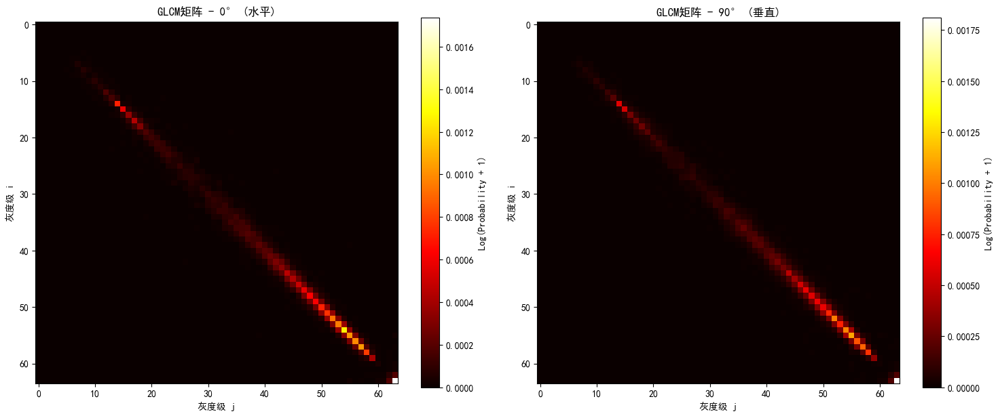

In [30]:
# 可视化GLCM矩阵
def visualize_glcm(glcm, distance_idx=0, angle_idx=0, title_prefix=""):
    """
    可视化GLCM矩阵
    
    参数:
        glcm: GLCM矩阵 [levels, levels, n_distances, n_angles]
        distance_idx: 距离索引
        angle_idx: 角度索引
        title_prefix: 标题前缀
    """
    # 提取指定方向和距离的GLCM
    glcm_slice = glcm[:, :, distance_idx, angle_idx]
    
    # 由于GLCM是256x256，显示时可能需要降采样
    # 为了可视化效果，可以只显示一部分或进行降采样
    downsample_factor = 4  # 降采样因子
    glcm_display = glcm_slice[::downsample_factor, ::downsample_factor]
    
    plt.figure(figsize=(10, 8))
    plt.imshow(np.log(glcm_display + 1), cmap='hot', interpolation='nearest')  # 使用log变换增强对比度
    plt.colorbar(label='Log(Probability + 1)')
    plt.title(f'{title_prefix}GLCM矩阵 (距离={distance_idx+1}, 角度索引={angle_idx})')
    plt.xlabel('灰度级 j')
    plt.ylabel('灰度级 i')
    plt.tight_layout()
    plt.show()

# 可视化不同方向的GLCM（0°和90°）
# 首先计算多方向GLCM
gray_img = rgb_to_grayscale(img)
gray_img_uint8 = (gray_img * 255).byte().numpy()

# 计算多方向GLCM（0°, 45°, 90°, 135°）
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
try:
    multi_glcm = graycomatrix(gray_img_uint8, distances=[1], angles=angles, 
                              levels=256, symmetric=True, normed=True)
except NameError:
    multi_glcm = greycomatrix(gray_img_uint8, distances=[1], angles=angles, 
                              levels=256, symmetric=True, normed=True)

angles_to_show = [0, 2]  # 0°和90°对应的索引（角度列表中的索引）
angle_labels = ['0° (水平)', '90° (垂直)']

plt.figure(figsize=(15, 6))
for idx, (angle_idx, angle_label) in enumerate(zip(angles_to_show, angle_labels)):
    glcm_slice = multi_glcm[:, :, 0, angle_idx]  # 距离为1的GLCM
    downsample_factor = 4
    glcm_display = glcm_slice[::downsample_factor, ::downsample_factor]
    
    plt.subplot(1, 2, idx+1)
    plt.imshow(np.log(glcm_display + 1), cmap='hot', interpolation='nearest')
    plt.colorbar(label='Log(Probability + 1)')
    plt.title(f'GLCM矩阵 - {angle_label}')
    plt.xlabel('灰度级 j')
    plt.ylabel('灰度级 i')

plt.tight_layout()
plt.show()


### 不同距离参数的GLCM

距离参数影响GLCM捕捉纹理的范围，不同距离可以捕捉不同尺度的纹理特征。


不同距离的GLCM纹理特征:
----------------------------------------------------------------------
特征                    距离=1       距离=2       距离=3       距离=5
----------------------------------------------------------------------
contrast         109.3623  301.9529  468.8659  753.9212
energy             0.2454    0.2440    0.2412    0.2352
homogeneity        0.4444    0.3819    0.3569    0.3305
correlation        0.9860    0.9613    0.9399    0.9034


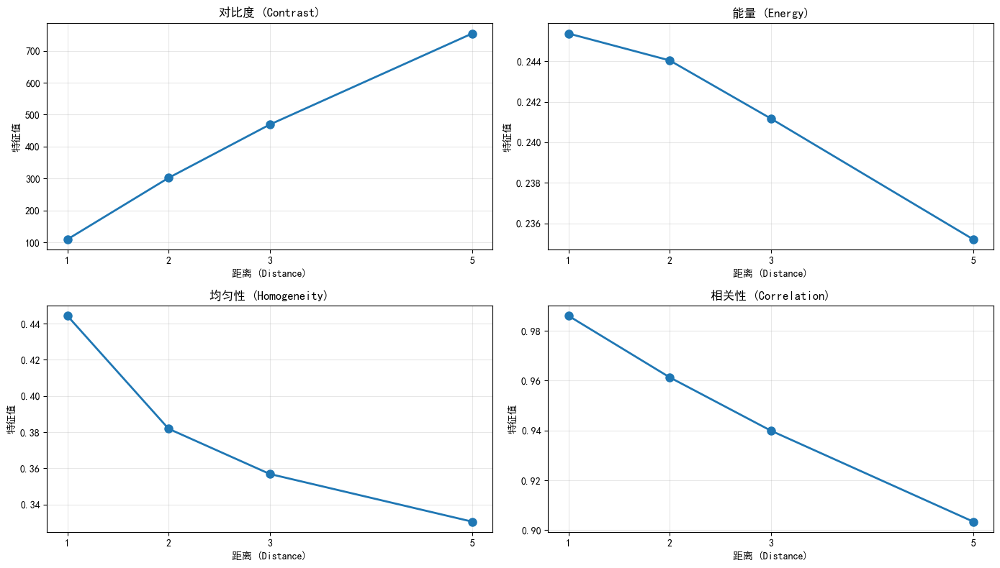

In [31]:
# 比较不同距离的GLCM特征
def compare_distance_features(img, distances=[1, 2, 3, 5], angle=0):
    """
    比较不同距离参数的GLCM特征
    """
    gray_img = rgb_to_grayscale(img)
    gray_img_uint8 = (gray_img * 255).byte().numpy()
    
    # 计算不同距离的GLCM（兼容新旧版本的skimage）
    try:
        glcm = graycomatrix(gray_img_uint8, distances=distances, angles=[angle], 
                           levels=256, symmetric=True, normed=True)
    except NameError:
        glcm = greycomatrix(gray_img_uint8, distances=distances, angles=[angle], 
                           levels=256, symmetric=True, normed=True)
    
    # 提取各距离的特征
    features_by_distance = {}
    prop_names = ['contrast', 'energy', 'homogeneity', 'correlation']
    
    for prop_name in prop_names:
        try:
            prop_values = graycoprops(glcm, prop_name)[:, 0]  # 获取所有距离的特征值
        except NameError:
            prop_values = greycoprops(glcm, prop_name)[:, 0]  # 获取所有距离的特征值
        features_by_distance[prop_name] = prop_values
    
    return features_by_distance, glcm

# 计算不同距离的特征
distance_features, distance_glcm = compare_distance_features(img)

print("不同距离的GLCM纹理特征:")
print("-" * 70)
print(f"{'特征':15s} {'距离=1':>10s} {'距离=2':>10s} {'距离=3':>10s} {'距离=5':>10s}")
print("-" * 70)

for prop_name, values in distance_features.items():
    print(f"{prop_name:15s}", end="")
    for v in values:
        print(f"  {v:>8.4f}", end="")
    print()

# 可视化不同距离的特征变化
plt.figure(figsize=(14, 8))

prop_names = ['contrast', 'energy', 'homogeneity', 'correlation']
prop_labels = ['对比度 (Contrast)', '能量 (Energy)', '均匀性 (Homogeneity)', '相关性 (Correlation)']
distances = [1, 2, 3, 5]

for i, (prop_name, prop_label) in enumerate(zip(prop_names, prop_labels)):
    plt.subplot(2, 2, i+1)
    values = distance_features[prop_name]
    plt.plot(distances, values, marker='o', linewidth=2, markersize=8)
    plt.title(prop_label)
    plt.xlabel('距离 (Distance)')
    plt.ylabel('特征值')
    plt.grid(alpha=0.3)
    plt.xticks(distances)

plt.tight_layout()
plt.show()


## 3. 纹理特征的应用场景

### 3.1 图像分类
- **材质识别**：区分不同材质（如木材、金属、织物等）
- **表面纹理分析**：分析物体表面的纹理特征
- **医学图像分析**：识别组织纹理，辅助疾病诊断

### 3.2 图像检索
- **基于纹理的图像检索**：通过比较纹理特征找到相似纹理的图像
- **产品分类**：根据产品表面的纹理特征进行分类

### 3.3 图像分割
- **纹理分割**：根据纹理特征将图像分割成不同区域
- **区域识别**：识别图像中的不同纹理区域

### 3.4 质量检测
- **表面缺陷检测**：检测产品表面的纹理异常
- **质量控制**：评估产品质量的一致性

## 4. 纹理特征与颜色特征的结合

在实际应用中，通常将纹理特征和颜色特征结合使用，以获得更全面的图像描述：


通道1数据形状: torch.Size([148225])
通道1直方图形状: torch.Size([32])
通道2数据形状: torch.Size([148225])
通道2直方图形状: torch.Size([32])
通道3数据形状: torch.Size([148225])
通道3直方图形状: torch.Size([32])
组合特征向量:
颜色特征维度:  (96,)
纹理特征维度:  (4,)
组合特征维度:  (100,)

纹理特征值:
  contrast    : 160.462318
  energy      : 0.242854
  homogeneity : 0.420353
  correlation : 0.979426


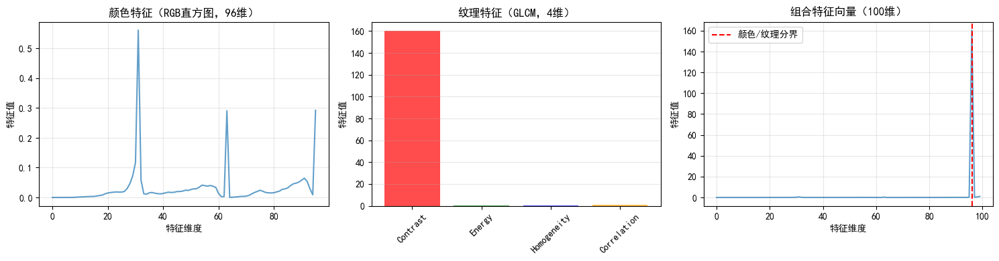

In [32]:
# 结合颜色特征和纹理特征
def extract_combined_features(img):
    """
    提取结合颜色特征和纹理特征的图像特征向量
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]
    
    返回:
        dict, 包含颜色特征和纹理特征的字典
    """
    # 1. 提取颜色特征（归一化RGB直方图）
    color_hist = normalized_color_histogram(img, bins=32).flatten()  # 96维
    
    # 2. 提取纹理特征（多方向GLCM特征）
    gray_img = rgb_to_grayscale(img)
    gray_img_uint8 = (gray_img * 255).byte().numpy()
    
    # 计算多方向GLCM（4个方向，取平均值）
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    try:
        glcm = graycomatrix(gray_img_uint8, distances=[1], angles=angles, 
                           levels=256, symmetric=True, normed=True)
    except NameError:
        glcm = greycomatrix(gray_img_uint8, distances=[1], angles=angles, 
                           levels=256, symmetric=True, normed=True)
    
    # 提取纹理特征（各方向的平均值）
    texture_feature_vector = []
    prop_names = ['contrast', 'energy', 'homogeneity', 'correlation']
    for prop_name in prop_names:
        try:
            prop_values = graycoprops(glcm, prop_name)[0, :]  # 4个方向的值
        except NameError:
            prop_values = greycoprops(glcm, prop_name)[0, :]  # 4个方向的值
        texture_feature_vector.append(np.mean(prop_values))  # 取平均值
    
    texture_feature_vector = np.array(texture_feature_vector)  # 4维
    
    # 3. 组合特征向量
    combined_feature = np.concatenate([
        color_hist.numpy(),  # 96维颜色特征
        texture_feature_vector  # 4维纹理特征
    ])
    
    return {
        'color_features': color_hist.numpy(),
        'texture_features': texture_feature_vector,
        'combined_features': combined_feature
    }

# 提取组合特征
combined_features = extract_combined_features(img)

print("组合特征向量:")
print(f"颜色特征维度:  {combined_features['color_features'].shape}")
print(f"纹理特征维度:  {combined_features['texture_features'].shape}")
print(f"组合特征维度:  {combined_features['combined_features'].shape}")

print("\n纹理特征值:")
for prop_name, value in zip(['contrast', 'energy', 'homogeneity', 'correlation'], 
                            combined_features['texture_features']):
    print(f"  {prop_name:12s}: {value:.6f}")

# 可视化特征分布
plt.figure(figsize=(15, 4))

# 颜色特征（直方图）
plt.subplot(1, 3, 1)
plt.plot(combined_features['color_features'], alpha=0.7)
plt.title('颜色特征（RGB直方图，96维）')
plt.xlabel('特征维度')
plt.ylabel('特征值')
plt.grid(alpha=0.3)

# 纹理特征（柱状图）
plt.subplot(1, 3, 2)
prop_names = ['Contrast', 'Energy', 'Homogeneity', 'Correlation']
plt.bar(prop_names, combined_features['texture_features'], alpha=0.7, color=['red', 'green', 'blue', 'orange'])
plt.title('纹理特征（GLCM，4维）')
plt.ylabel('特征值')
plt.xticks(rotation=45)
plt.grid(alpha=0.3, axis='y')

# 组合特征概览
plt.subplot(1, 3, 3)
plt.plot(combined_features['combined_features'], alpha=0.7)
plt.axvline(x=96, color='r', linestyle='--', label='颜色/纹理分界')
plt.title('组合特征向量（100维）')
plt.xlabel('特征维度')
plt.ylabel('特征值')
plt.legend()
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


## 5. 总结

### 纹理特征（GLCM）的特点：
- ✅ **优点**：
  - 能够捕捉纹理的空间结构信息
  - 对纹理的方向性敏感
  - 在材质识别等任务中效果较好
- ❌ **缺点**：
  - 计算复杂度较高
  - 对噪声较敏感
  - 需要选择合适的方向和距离参数

### 颜色特征 vs 纹理特征：
- **颜色特征**：主要描述图像的色彩分布，计算简单，但对光照敏感
- **纹理特征**：主要描述图像的空间结构模式，计算复杂，但能捕捉更多细节信息

### 最佳实践：
1. **特征选择**：根据具体任务选择合适的特征类型
2. **特征融合**：将颜色特征和纹理特征结合使用，往往能获得更好的效果
3. **参数调优**：GLCM的距离和角度参数需要根据图像特点进行调整
4. **特征归一化**：在组合不同特征时，需要进行归一化处理，确保各特征的重要性平衡


---

# 角点检测

## 3. Harris角点检测

Harris角点检测是一种经典的角点检测算法，由Chris Harris和Mike Stephens在1988年提出。它通过计算图像局部窗口的自相关矩阵来判断该窗口是否包含角点特征。

### 知识点梳理

**1. Harris角点检测的基本原理**
- **角点的定义**：
  - **平坦区域**：图像在该区域的灰度值变化很小，无论向哪个方向移动窗口
  - **边缘**：图像在该区域沿某个方向灰度值变化大，沿垂直方向变化小
  - **角点**：图像在该区域沿任意方向移动窗口，灰度值都会发生显著变化
- **核心思想**：
  - 使用一个局部窗口在图像上滑动
  - 计算窗口在各个方向移动时的灰度值变化量
  - 通过自相关矩阵的特征值来判断该点是否为角点
- **优点**：
  - 对旋转、平移具有不变性
  - 对光照变化具有一定的鲁棒性
  - 计算相对简单，检测效果好
  - 可以给出角点的响应强度
- **缺点**：
  - 对尺度变化敏感（同一角点在不同尺度下可能检测不到）
  - 需要手动设置阈值参数
  - 计算量相对较大（需要计算梯度和矩阵运算）

**2. Harris算法的数学原理**
- **自相关函数**：衡量窗口在不同方向移动时的灰度变化
  - $E(u,v) = \sum_{x,y} w(x,y)[I(x+u,y+v) - I(x,y)]^2$
  - 其中$w(x,y)$是窗口函数（通常是高斯函数），$I(x,y)$是图像灰度值
- **二阶矩矩阵（M矩阵）**：
  - $M = \sum_{x,y} w(x,y) \begin{bmatrix} I_x^2 & I_x I_y \\ I_x I_y & I_y^2 \end{bmatrix}$
  - 其中$I_x$和$I_y$分别是图像在x和y方向的梯度
- **角点响应函数（R）**：
  - $R = \det(M) - k \cdot \text{trace}(M)^2$
  - $\det(M) = \lambda_1 \lambda_2$（特征值的乘积）
  - $\text{trace}(M) = \lambda_1 + \lambda_2$（特征值的和）
  - 当$R > threshold$时，判定为角点

**3. Harris算法的参数选择**
- **k参数**：经验值通常为0.04~0.06
  - k值越大，对边缘的响应越强
  - k值越小，对角点的检测越严格
- **阈值（threshold）**：决定哪些响应值被认为是角点
  - 阈值越高，检测到的角点越少（只保留强角点）
  - 阈值越低，检测到的角点越多（可能包含一些弱角点或噪声）
- **窗口大小**：影响梯度计算和平滑的窗口大小
  - 窗口越大，检测到的角点越少，但更稳定
  - 窗口越小，检测到的角点越多，但可能受噪声影响

**4. 非极大值抑制（NMS）**
- **目的**：去除相邻区域的重复角点检测
- **方法**：在局部窗口内只保留响应值最大的角点
- **窗口大小**：通常为3×3或5×5


In [33]:
import torch.nn.functional as F

def harris_corner_detection(img, k=0.04, threshold=0.01):
    """
    Harris角点检测
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]，值域[0, 1]
        k: float, Harris角点检测的常数，通常为0.04~0.06，默认0.04
        threshold: float, 角点响应阈值，默认0.01
    
    返回:
        corners: torch.Tensor, 布尔矩阵 [H, W]，True表示检测到角点
        response: torch.Tensor, 角点响应矩阵 [H, W]
    """
    # 转为灰度图
    gray = rgb_to_grayscale(img).unsqueeze(0).unsqueeze(0)  # [1, 1, H, W]
    
    # 计算梯度（使用Sobel算子）
    sobel_x = torch.tensor([[-1, 0, 1], 
                            [-2, 0, 2], 
                            [-1, 0, 1]], dtype=torch.float32)
    sobel_y = torch.tensor([[-1, -2, -1], 
                            [0, 0, 0], 
                            [1, 2, 1]], dtype=torch.float32)
    
    sobel_x = sobel_x.view(1, 1, 3, 3)
    sobel_y = sobel_y.view(1, 1, 3, 3)
    
    # 计算x和y方向的梯度
    Ix = F.conv2d(gray, sobel_x, padding=1)
    Iy = F.conv2d(gray, sobel_y, padding=1)
    
    # 计算M矩阵的元素
    Ix2 = Ix * Ix      # I_x^2
    Iy2 = Iy * Iy      # I_y^2
    Ixy = Ix * Iy      # I_x * I_y
    
    # 高斯滤波（对M矩阵的元素进行加权平均）
    # 这里使用简单的均值滤波作为近似，实际应用中建议使用高斯滤波
    window = torch.ones(1, 1, 3, 3) / 9.0
    Sx2 = F.conv2d(Ix2, window, padding=1)  # 加权后的 I_x^2
    Sy2 = F.conv2d(Iy2, window, padding=1)  # 加权后的 I_y^2
    Sxy = F.conv2d(Ixy, window, padding=1)  # 加权后的 I_x * I_y
    
    # 计算角点响应函数 R = det(M) - k * trace(M)^2
    det = Sx2 * Sy2 - Sxy * Sxy  # det(M) = λ1 * λ2
    trace = Sx2 + Sy2             # trace(M) = λ1 + λ2
    R = det - k * trace * trace   # Harris响应函数
    
    # 非极大值抑制（NMS）：在3×3窗口内保留局部最大值
    max_pool = F.max_pool2d(R, 3, stride=1, padding=1)
    corners = (R == max_pool) & (R > threshold)
    
    return corners.squeeze(), R.squeeze()

# 应用示例
corners, response = harris_corner_detection(img, k=0.04, threshold=0.01)
num_corners = corners.sum().item()
print(f"检测到 {num_corners} 个角点")
print(f"角点响应值范围: [{response.min().item():.4f}, {response.max().item():.4f}]")


检测到 188 个角点
角点响应值范围: [-1.5673, 16.4260]


### 角点检测结果可视化

通过可视化可以直观地观察Harris角点检测的效果，包括角点位置、响应强度等。


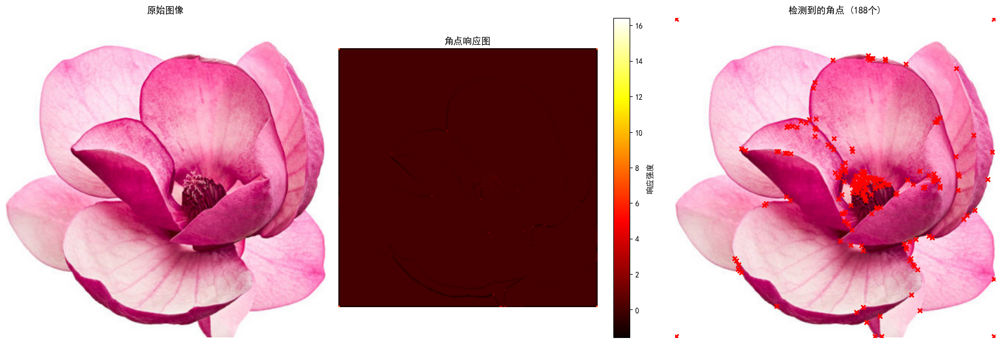

In [34]:
# 可视化角点检测结果
def visualize_corners(img, corners, response, title_suffix=""):
    """
    可视化Harris角点检测结果
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]
        corners: torch.Tensor, 角点布尔矩阵 [H, W]
        response: torch.Tensor, 角点响应矩阵 [H, W]
        title_suffix: str, 标题后缀
    """
    # 将图像转换为numpy格式用于显示
    img_np = img.permute(1, 2, 0).numpy()
    corners_np = corners.numpy()
    response_np = response.numpy()
    
    # 创建可视化图像
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # 1. 原始图像
    axes[0].imshow(img_np)
    axes[0].set_title(f'原始图像{title_suffix}')
    axes[0].axis('off')
    
    # 2. 角点响应图
    im1 = axes[1].imshow(response_np, cmap='hot')
    axes[1].set_title(f'角点响应图{title_suffix}')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], label='响应强度')
    
    # 3. 检测到的角点（在原始图像上标记）
    axes[2].imshow(img_np)
    corner_coords = torch.nonzero(corners, as_tuple=False)
    if len(corner_coords) > 0:
        axes[2].scatter(corner_coords[:, 1].numpy(), 
                       corner_coords[:, 0].numpy(), 
                       c='red', s=30, marker='x', linewidths=2)
    axes[2].set_title(f'检测到的角点 ({corners.sum().item()}个){title_suffix}')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# 可视化角点检测结果
visualize_corners(img, corners, response)


### 不同参数的影响

Harris角点检测的效果受k参数和阈值参数的影响。通过调整这些参数，可以控制检测到的角点数量和强度。


不同阈值下的角点检测结果:
--------------------------------------------------
阈值 0.005: 检测到  264 个角点
阈值 0.010: 检测到  188 个角点
阈值 0.020: 检测到  138 个角点
阈值 0.050: 检测到  102 个角点


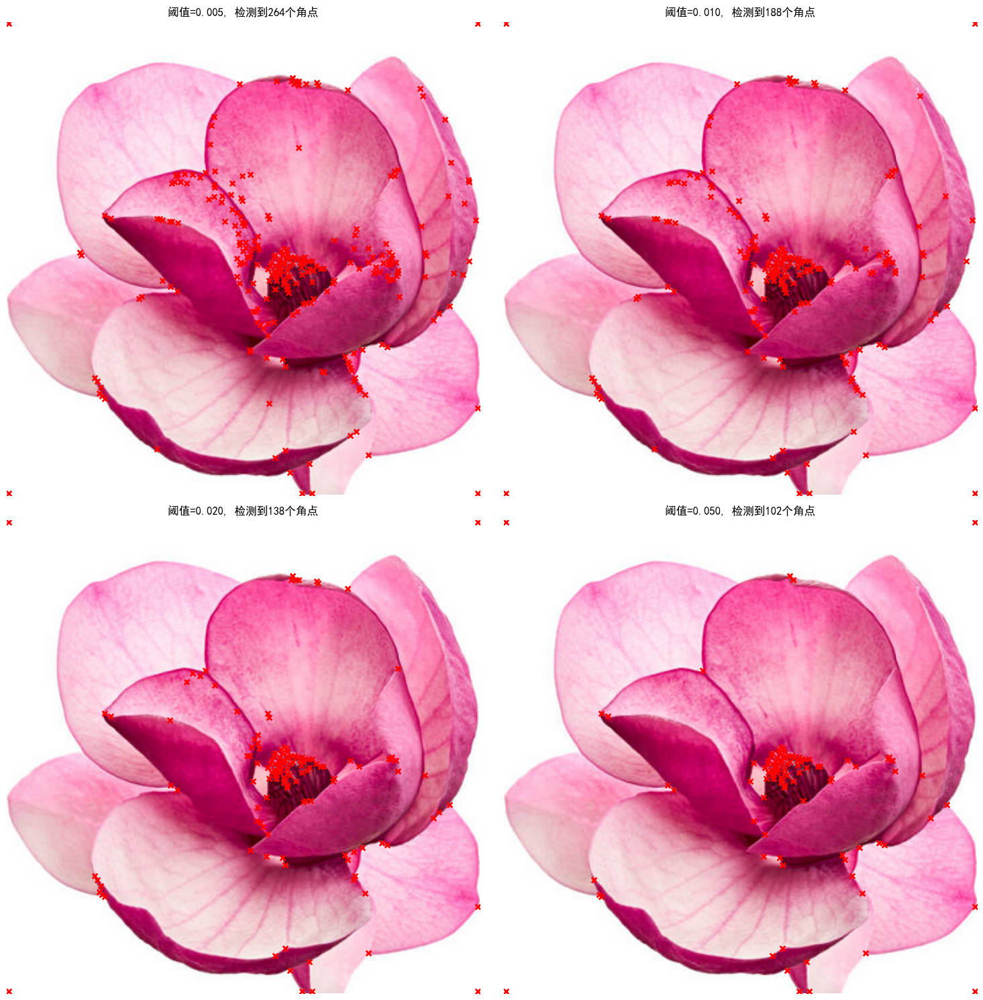


不同k值下的角点检测结果（阈值=0.01）:
--------------------------------------------------
k=0.02: 检测到  235 个角点
k=0.04: 检测到  188 个角点
k=0.06: 检测到  158 个角点
k=0.08: 检测到  135 个角点


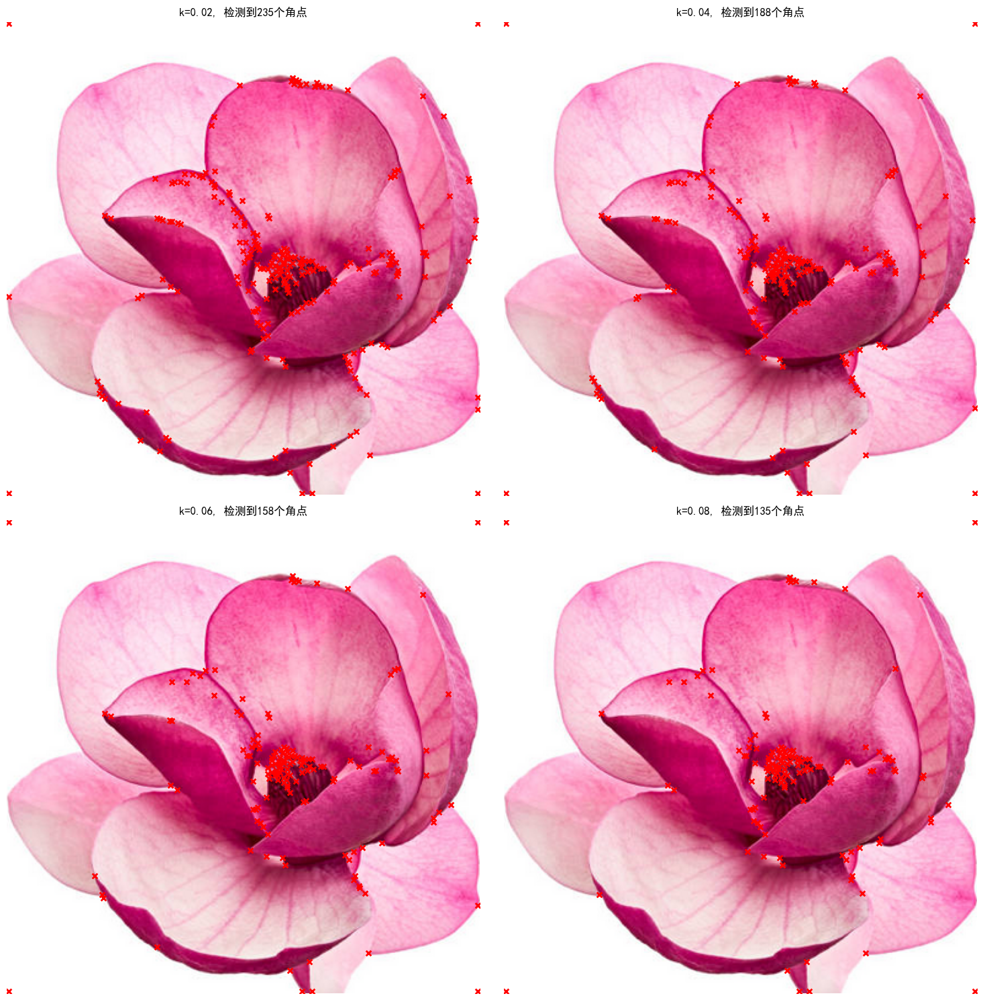

In [35]:
# 比较不同阈值的影响
def compare_thresholds(img, k=0.04, thresholds=[0.005, 0.01, 0.02, 0.05]):
    """
    比较不同阈值对角点检测的影响
    """
    results = {}
    for threshold in thresholds:
        corners, response = harris_corner_detection(img, k=k, threshold=threshold)
        results[threshold] = {
            'corners': corners,
            'response': response,
            'num_corners': corners.sum().item()
        }
    return results

# 比较不同阈值
threshold_results = compare_thresholds(img, k=0.04, thresholds=[0.005, 0.01, 0.02, 0.05])

print("不同阈值下的角点检测结果:")
print("-" * 50)
for threshold, result in threshold_results.items():
    print(f"阈值 {threshold:.3f}: 检测到 {result['num_corners']:4d} 个角点")

# 可视化不同阈值的效果
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes = axes.flatten()

img_np = img.permute(1, 2, 0).numpy()
for idx, (threshold, result) in enumerate(threshold_results.items()):
    ax = axes[idx]
    ax.imshow(img_np)
    
    corner_coords = torch.nonzero(result['corners'], as_tuple=False)
    if len(corner_coords) > 0:
        ax.scatter(corner_coords[:, 1].numpy(), 
                  corner_coords[:, 0].numpy(), 
                  c='red', s=30, marker='x', linewidths=2)
    
    ax.set_title(f'阈值={threshold:.3f}, 检测到{result["num_corners"]}个角点')
    ax.axis('off')

plt.tight_layout()
plt.show()

# 比较不同k值的影响
def compare_k_values(img, k_values=[0.02, 0.04, 0.06, 0.08], threshold=0.01):
    """
    比较不同k值对角点检测的影响
    """
    results = {}
    for k in k_values:
        corners, response = harris_corner_detection(img, k=k, threshold=threshold)
        results[k] = {
            'corners': corners,
            'response': response,
            'num_corners': corners.sum().item()
        }
    return results

# 比较不同k值
k_results = compare_k_values(img, k_values=[0.02, 0.04, 0.06, 0.08], threshold=0.01)

print("\n不同k值下的角点检测结果（阈值=0.01）:")
print("-" * 50)
for k, result in k_results.items():
    print(f"k={k:.2f}: 检测到 {result['num_corners']:4d} 个角点")

# 可视化不同k值的效果
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes = axes.flatten()

img_np = img.permute(1, 2, 0).numpy()
for idx, (k, result) in enumerate(k_results.items()):
    ax = axes[idx]
    ax.imshow(img_np)
    
    corner_coords = torch.nonzero(result['corners'], as_tuple=False)
    if len(corner_coords) > 0:
        ax.scatter(corner_coords[:, 1].numpy(), 
                  corner_coords[:, 0].numpy(), 
                  c='red', s=30, marker='x', linewidths=2)
    
    ax.set_title(f'k={k:.2f}, 检测到{result["num_corners"]}个角点')
    ax.axis('off')

plt.tight_layout()
plt.show()


### 角点响应强度分析

通过分析角点响应值的分布，可以更好地理解Harris算法的检测效果，并选择合适的阈值。


角点响应值统计:
--------------------------------------------------
最小值:     -1.567297
最大值:     16.426025
平均值:     -0.027165
中位数:     0.000001
标准差:     0.203803
超过阈值的像素数:   1465 (0.99%)


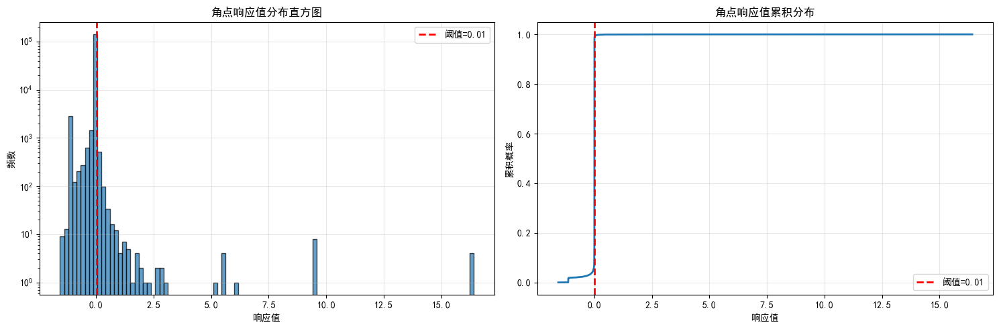

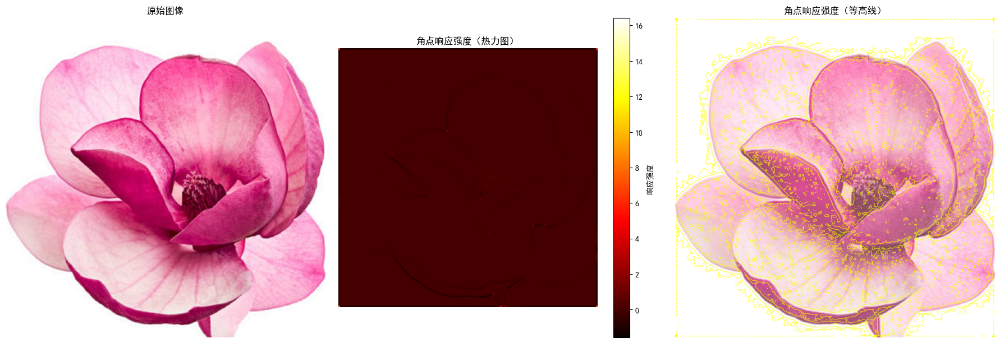

In [36]:
# 分析角点响应值的分布
def analyze_response_distribution(response, threshold):
    """
    分析角点响应值的分布情况
    """
    response_np = response.numpy()
    response_flat = response_np.flatten()
    
    # 统计信息
    stats = {
        'min': response_flat.min(),
        'max': response_flat.max(),
        'mean': response_flat.mean(),
        'median': np.median(response_flat),
        'std': response_flat.std(),
        'above_threshold': (response_flat > threshold).sum(),
        'total_pixels': len(response_flat),
        'corner_ratio': (response_flat > threshold).sum() / len(response_flat) * 100
    }
    
    return stats, response_flat

# 分析响应分布
stats, response_flat = analyze_response_distribution(response, threshold=0.01)

print("角点响应值统计:")
print("-" * 50)
print(f"最小值:     {stats['min']:.6f}")
print(f"最大值:     {stats['max']:.6f}")
print(f"平均值:     {stats['mean']:.6f}")
print(f"中位数:     {stats['median']:.6f}")
print(f"标准差:     {stats['std']:.6f}")
print(f"超过阈值的像素数: {stats['above_threshold']:6d} ({stats['corner_ratio']:.2f}%)")

# 可视化响应分布
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# 响应值直方图
axes[0].hist(response_flat, bins=100, alpha=0.7, edgecolor='black')
axes[0].axvline(x=0.01, color='r', linestyle='--', linewidth=2, label=f'阈值=0.01')
axes[0].set_xlabel('响应值')
axes[0].set_ylabel('频数')
axes[0].set_title('角点响应值分布直方图')
axes[0].set_yscale('log')  # 使用对数坐标
axes[0].legend()
axes[0].grid(alpha=0.3)

# 累积分布
sorted_response = np.sort(response_flat)
cumulative = np.arange(1, len(sorted_response) + 1) / len(sorted_response)
axes[1].plot(sorted_response, cumulative, linewidth=2)
axes[1].axvline(x=0.01, color='r', linestyle='--', linewidth=2, label=f'阈值=0.01')
axes[1].set_xlabel('响应值')
axes[1].set_ylabel('累积概率')
axes[1].set_title('角点响应值累积分布')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# 可视化响应强度的空间分布
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

img_np = img.permute(1, 2, 0).numpy()
response_np = response.numpy()

# 原始图像
axes[0].imshow(img_np)
axes[0].set_title('原始图像')
axes[0].axis('off')

# 响应强度图（热力图）
im = axes[1].imshow(response_np, cmap='hot', interpolation='bilinear')
axes[1].set_title('角点响应强度（热力图）')
axes[1].axis('off')
plt.colorbar(im, ax=axes[1], label='响应强度')

# 响应强度图（等高线）
axes[2].imshow(img_np, alpha=0.7)
contour = axes[2].contour(response_np, levels=20, colors='yellow', linewidths=1, alpha=0.6)
axes[2].clabel(contour, inline=True, fontsize=8)
axes[2].set_title('角点响应强度（等高线）')
axes[2].axis('off')

plt.tight_layout()
plt.show()


## 4. Harris角点检测的应用场景

### 4.1 特征点提取
- **图像配准**：提取角点作为特征点进行图像对齐
- **全景拼接**：通过角点匹配实现多张图像的拼接
- **图像检索**：使用角点作为图像特征进行相似度匹配

### 4.2 目标跟踪
- **关键点跟踪**：跟踪视频序列中的角点
- **运动估计**：通过角点对应关系估计相机运动

### 4.3 三维重建
- **立体视觉**：通过匹配左右图像中的角点进行深度估计
- **结构恢复**：从多个视角的图像中恢复三维结构

### 4.4 图像分析
- **形状分析**：通过角点检测分析物体的形状特征
- **边缘检测的补充**：与边缘检测结合，提供更丰富的特征信息

## 5. 改进的Harris角点检测

### 5.1 使用高斯滤波

标准的Harris算法使用均值滤波，实际应用中通常使用高斯滤波来更好地平滑梯度信息。


均值滤波 vs 高斯滤波:
----------------------------------------
均值滤波:  检测到 188 个角点
高斯滤波:  检测到 141 个角点


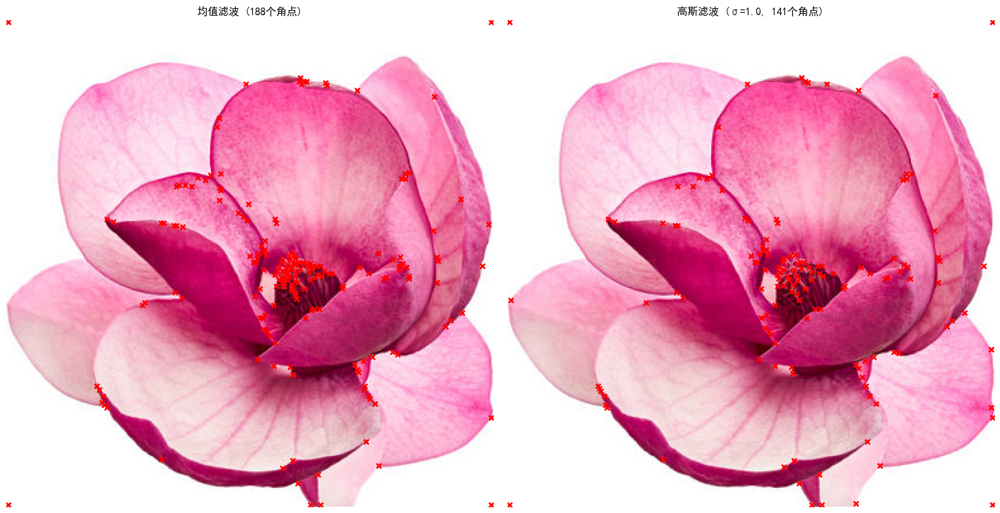

In [37]:
# 改进的Harris角点检测（使用高斯滤波）
def harris_corner_detection_gaussian(img, k=0.04, threshold=0.01, sigma=1.0):
    """
    使用高斯滤波的Harris角点检测
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]，值域[0, 1]
        k: float, Harris常数，默认0.04
        threshold: float, 角点响应阈值，默认0.01
        sigma: float, 高斯滤波的标准差，默认1.0
    """
    # 转为灰度图
    gray = rgb_to_grayscale(img).unsqueeze(0).unsqueeze(0)  # [1, 1, H, W]
    
    # 计算梯度（使用Sobel算子）
    sobel_x = torch.tensor([[-1, 0, 1], 
                            [-2, 0, 2], 
                            [-1, 0, 1]], dtype=torch.float32).view(1, 1, 3, 3)
    sobel_y = torch.tensor([[-1, -2, -1], 
                            [0, 0, 0], 
                            [1, 2, 1]], dtype=torch.float32).view(1, 1, 3, 3)
    
    Ix = F.conv2d(gray, sobel_x, padding=1)
    Iy = F.conv2d(gray, sobel_y, padding=1)
    
    # 计算M矩阵的元素
    Ix2 = Ix * Ix
    Iy2 = Iy * Iy
    Ixy = Ix * Iy
    
    # 创建高斯核
    kernel_size = int(6 * sigma + 1)
    if kernel_size % 2 == 0:
        kernel_size += 1
    
    x = torch.arange(kernel_size, dtype=torch.float32) - kernel_size // 2
    y = torch.arange(kernel_size, dtype=torch.float32) - kernel_size // 2
    xx, yy = torch.meshgrid(x, y, indexing='ij')
    gaussian_kernel = torch.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    gaussian_kernel = gaussian_kernel / gaussian_kernel.sum()
    gaussian_kernel = gaussian_kernel.view(1, 1, kernel_size, kernel_size)
    
    # 使用高斯滤波
    Sx2 = F.conv2d(Ix2, gaussian_kernel, padding=kernel_size//2)
    Sy2 = F.conv2d(Iy2, gaussian_kernel, padding=kernel_size//2)
    Sxy = F.conv2d(Ixy, gaussian_kernel, padding=kernel_size//2)
    
    # 计算角点响应
    det = Sx2 * Sy2 - Sxy * Sxy
    trace = Sx2 + Sy2
    R = det - k * trace * trace
    
    # 非极大值抑制
    max_pool = F.max_pool2d(R, 3, stride=1, padding=1)
    corners = (R == max_pool) & (R > threshold)
    
    return corners.squeeze(), R.squeeze()

# 比较均值滤波和高斯滤波的效果
corners_mean, response_mean = harris_corner_detection(img, k=0.04, threshold=0.01)
corners_gaussian, response_gaussian = harris_corner_detection_gaussian(img, k=0.04, threshold=0.01, sigma=1.0)

print("均值滤波 vs 高斯滤波:")
print("-" * 40)
print(f"均值滤波:  检测到 {corners_mean.sum().item()} 个角点")
print(f"高斯滤波:  检测到 {corners_gaussian.sum().item()} 个角点")

# 可视化对比
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
img_np = img.permute(1, 2, 0).numpy()

# 均值滤波结果
axes[0].imshow(img_np)
corner_coords_mean = torch.nonzero(corners_mean, as_tuple=False)
if len(corner_coords_mean) > 0:
    axes[0].scatter(corner_coords_mean[:, 1].numpy(), 
                   corner_coords_mean[:, 0].numpy(), 
                   c='red', s=30, marker='x', linewidths=2)
axes[0].set_title(f'均值滤波 ({corners_mean.sum().item()}个角点)')
axes[0].axis('off')

# 高斯滤波结果
axes[1].imshow(img_np)
corner_coords_gaussian = torch.nonzero(corners_gaussian, as_tuple=False)
if len(corner_coords_gaussian) > 0:
    axes[1].scatter(corner_coords_gaussian[:, 1].numpy(), 
                   corner_coords_gaussian[:, 0].numpy(), 
                   c='red', s=30, marker='x', linewidths=2)
axes[1].set_title(f'高斯滤波 (σ=1.0, {corners_gaussian.sum().item()}个角点)')
axes[1].axis('off')

plt.tight_layout()
plt.show()


## 6. 总结

### Harris角点检测的特点：
- ✅ **优点**：
  - 对旋转、平移具有不变性
  - 对光照变化具有一定的鲁棒性
  - 可以给出角点的响应强度
  - 算法原理清晰，实现相对简单
- ❌ **缺点**：
  - 对尺度变化敏感（多尺度Harris可以解决）
  - 需要手动设置阈值参数
  - 计算量相对较大
  - 对噪声较敏感（可以通过预处理改善）

### 与其他特征检测方法的对比：
- **颜色特征**：描述图像的色彩分布，计算简单，但对光照敏感
- **纹理特征**：描述图像的空间结构模式，计算复杂，能捕捉细节信息
- **角点特征**：描述图像中的关键点位置，对几何变换鲁棒，适合特征匹配

### 最佳实践：
1. **参数调优**：根据具体图像和任务调整k值和阈值
   - k值：通常0.04~0.06，可以根据检测需求微调
   - 阈值：通过分析响应分布来选择，避免过多或过少的角点
2. **预处理**：对噪声较大的图像进行高斯滤波预处理
3. **后处理**：使用非极大值抑制去除重复检测的角点
4. **特征组合**：可以与其他特征（颜色、纹理）结合使用，获得更全面的图像描述
5. **多尺度检测**：对于需要处理不同尺度图像的场景，可以使用多尺度Harris检测


---

# 边缘检测

## 4. 边缘检测 - Sobel算子

边缘检测是图像处理中的基础操作之一，用于检测图像中灰度值变化显著的像素点。Sobel算子是一种经典的边缘检测算子，由Irwin Sobel在1968年提出。它通过计算图像的梯度来检测边缘。

### 知识点梳理

**1. 边缘检测的基本原理**
- **边缘的定义**：
  - 边缘是图像中灰度值发生剧烈变化的区域
  - 边缘通常对应物体的边界、阴影、纹理变化等
  - 边缘是图像的重要特征，可以用于图像分割、目标识别等任务
- **边缘检测的基本思想**：
  - 计算图像中每个像素点的梯度
  - 梯度大的地方对应边缘
  - 通过设置阈值来筛选边缘点
- **优点**：
  - 计算简单高效
  - 对噪声具有一定的鲁棒性
  - 可以检测边缘的方向信息
- **缺点**：
  - 对噪声敏感（需要通过预处理改善）
  - 检测到的边缘可能较粗（需要细化处理）
  - 容易产生伪边缘

**2. Sobel算子的数学原理**
- **Sobel算子**：
  - Sobel算子使用两个3×3的卷积核（Sobel_x和Sobel_y）来计算图像的梯度
  - Sobel_x用于检测垂直边缘（水平方向的梯度）
  - Sobel_y用于检测水平边缘（垂直方向的梯度）
- **Sobel算子模板**：
  $$
  \text{Sobel}_x = \begin{bmatrix}
  -1 & 0 & 1 \\
  -2 & 0 & 2 \\
  -1 & 0 & 1
  \end{bmatrix}, \quad
  \text{Sobel}_y = \begin{bmatrix}
  -1 & -2 & -1 \\
  0 & 0 & 0 \\
  1 & 2 & 1
  \end{bmatrix}
  $$
- **梯度计算**：
  - 水平梯度：$G_x = I * \text{Sobel}_x$
  - 垂直梯度：$G_y = I * \text{Sobel}_y$
  - 梯度幅值：$G = \sqrt{G_x^2 + G_y^2}$
  - 梯度方向：$\theta = \arctan\left(\frac{G_y}{G_x}\right)$
- **Sobel算子的特点**：
  - 对垂直和水平边缘敏感
  - 中间行的权重更大（-2和2），对中心像素更敏感
  - 计算简单，适合实时处理

**3. 边缘检测的步骤**
- **步骤1**：将图像转换为灰度图
- **步骤2**：使用Sobel算子计算梯度（水平和垂直方向）
- **步骤3**：计算梯度幅值和方向
- **步骤4**：应用阈值化（可选）来筛选边缘点
- **步骤5**：非极大值抑制（可选）来细化边缘

**4. 与其他边缘检测算子的对比**
- **Roberts算子**：最简单的边缘检测算子，但抗噪声能力差
- **Prewitt算子**：类似Sobel，但权值都是1或-1，不如Sobel对噪声敏感
- **Sobel算子**：在精度和抗噪声之间取得平衡，最常用
- **Canny算子**：多步骤边缘检测，包括非极大值抑制和双阈值，效果最好但计算复杂


In [38]:
def sobel_edge_detection(img):
    """
    Sobel边缘检测
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]，值域[0, 1]
    
    返回:
        magnitude: torch.Tensor, 梯度幅值 [H, W]
        direction: torch.Tensor, 梯度方向（弧度）[H, W]
        grad_x: torch.Tensor, 水平梯度 [H, W]
        grad_y: torch.Tensor, 垂直梯度 [H, W]
    """
    # 转为灰度图
    gray = rgb_to_grayscale(img).unsqueeze(0).unsqueeze(0)  # [1, 1, H, W]
    
    # Sobel算子模板
    # Sobel_x: 检测垂直边缘（水平方向的梯度）
    sobel_x = torch.tensor([[-1, 0, 1], 
                            [-2, 0, 2], 
                            [-1, 0, 1]], dtype=torch.float32)
    # Sobel_y: 检测水平边缘（垂直方向的梯度）
    sobel_y = torch.tensor([[-1, -2, -1], 
                            [0, 0, 0], 
                            [1, 2, 1]], dtype=torch.float32)
    
    sobel_x = sobel_x.view(1, 1, 3, 3)
    sobel_y = sobel_y.view(1, 1, 3, 3)
    
    # 计算梯度（水平和垂直方向）
    grad_x = F.conv2d(gray, sobel_x, padding=1)  # 水平梯度
    grad_y = F.conv2d(gray, sobel_y, padding=1)  # 垂直梯度
    
    # 计算梯度幅值和方向
    magnitude = torch.sqrt(grad_x**2 + grad_y**2)  # 梯度幅值
    direction = torch.atan2(grad_y, grad_x)        # 梯度方向（弧度）
    
    return magnitude.squeeze(), direction.squeeze(), grad_x.squeeze(), grad_y.squeeze()

# 应用示例
edge_magnitude, edge_direction, grad_x, grad_y = sobel_edge_detection(img)
print(f"边缘强度图形状: {edge_magnitude.shape}")
print(f"梯度幅值范围: [{edge_magnitude.min().item():.4f}, {edge_magnitude.max().item():.4f}]")
print(f"梯度方向范围: [{edge_direction.min().item():.4f}, {edge_direction.max().item():.4f}] 弧度")


边缘强度图形状: torch.Size([385, 385])
梯度幅值范围: [0.0000, 4.2422]
梯度方向范围: [-3.1416, 3.1416] 弧度


### Sobel边缘检测结果可视化

通过可视化可以直观地观察Sobel边缘检测的效果，包括梯度幅值、梯度方向和各个方向的梯度。


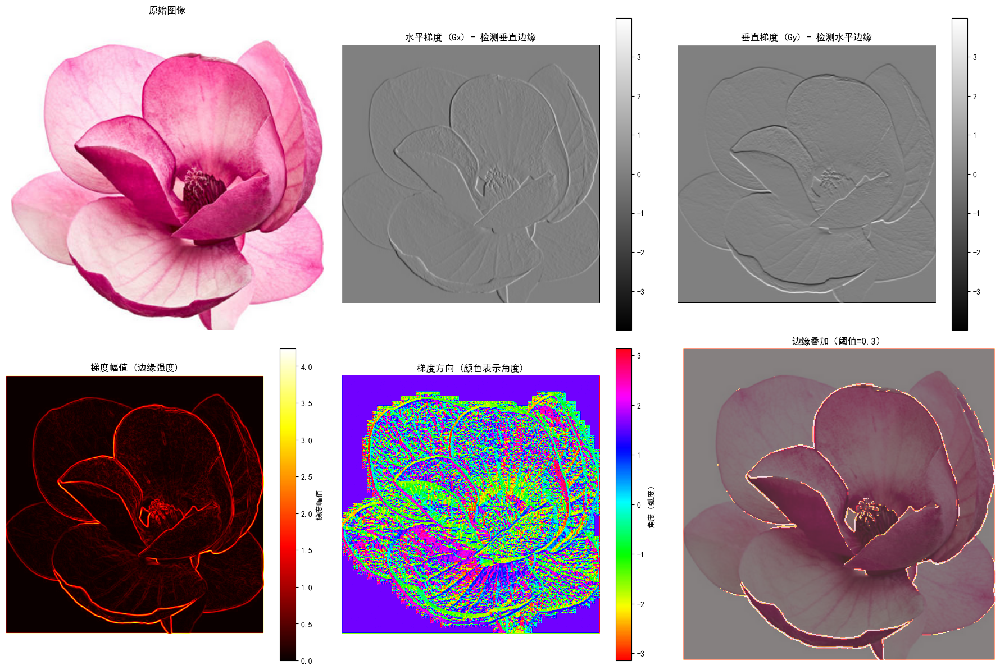

In [39]:
# 可视化Sobel边缘检测结果
def visualize_sobel_edges(img, magnitude, direction, grad_x, grad_y):
    """
    可视化Sobel边缘检测结果
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]
        magnitude: torch.Tensor, 梯度幅值 [H, W]
        direction: torch.Tensor, 梯度方向 [H, W]
        grad_x: torch.Tensor, 水平梯度 [H, W]
        grad_y: torch.Tensor, 垂直梯度 [H, W]
    """
    img_np = img.permute(1, 2, 0).numpy()
    magnitude_np = magnitude.numpy()
    direction_np = direction.numpy()
    grad_x_np = grad_x.numpy()
    grad_y_np = grad_y.numpy()
    
    # 创建可视化图像
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # 1. 原始图像
    axes[0, 0].imshow(img_np)
    axes[0, 0].set_title('原始图像')
    axes[0, 0].axis('off')
    
    # 2. 水平梯度（Gx）
    im1 = axes[0, 1].imshow(grad_x_np, cmap='gray')
    axes[0, 1].set_title('水平梯度 (Gx) - 检测垂直边缘')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1])
    
    # 3. 垂直梯度（Gy）
    im2 = axes[0, 2].imshow(grad_y_np, cmap='gray')
    axes[0, 2].set_title('垂直梯度 (Gy) - 检测水平边缘')
    axes[0, 2].axis('off')
    plt.colorbar(im2, ax=axes[0, 2])
    
    # 4. 梯度幅值
    im3 = axes[1, 0].imshow(magnitude_np, cmap='hot')
    axes[1, 0].set_title('梯度幅值 (边缘强度)')
    axes[1, 0].axis('off')
    plt.colorbar(im3, ax=axes[1, 0], label='梯度幅值')
    
    # 5. 梯度方向
    im4 = axes[1, 1].imshow(direction_np, cmap='hsv')
    axes[1, 1].set_title('梯度方向 (颜色表示角度)')
    axes[1, 1].axis('off')
    plt.colorbar(im4, ax=axes[1, 1], label='角度（弧度）')
    
    # 6. 叠加显示（在原始图像上叠加边缘）
    axes[1, 2].imshow(img_np, alpha=0.7)
    # 归一化梯度幅值用于显示
    magnitude_normalized = (magnitude_np - magnitude_np.min()) / (magnitude_np.max() - magnitude_np.min() + 1e-8)
    magnitude_normalized = (magnitude_normalized > 0.3).astype(float)  # 阈值化
    axes[1, 2].imshow(magnitude_normalized, cmap='hot', alpha=0.5)
    axes[1, 2].set_title('边缘叠加（阈值=0.3）')
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# 可视化边缘检测结果
visualize_sobel_edges(img, edge_magnitude, edge_direction, grad_x, grad_y)


### 阈值化边缘检测

通过设置阈值，可以将梯度幅值图转换为二值边缘图像，突出显示边缘。


阈值 0.1: 检测到 13861 个边缘像素 (9.35%)
阈值 0.2: 检测到 7356 个边缘像素 (4.96%)
阈值 0.3: 检测到 4801 个边缘像素 (3.24%)
阈值 0.4: 检测到 3347 个边缘像素 (2.26%)


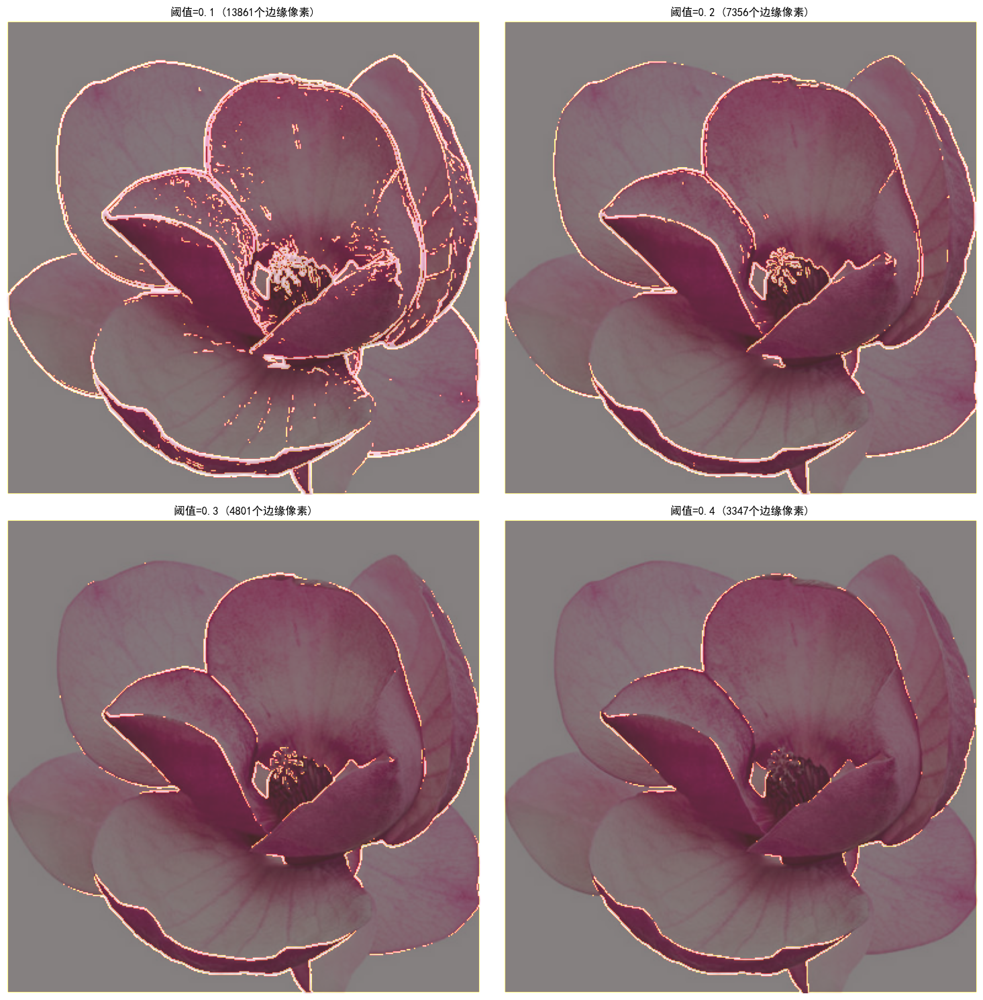

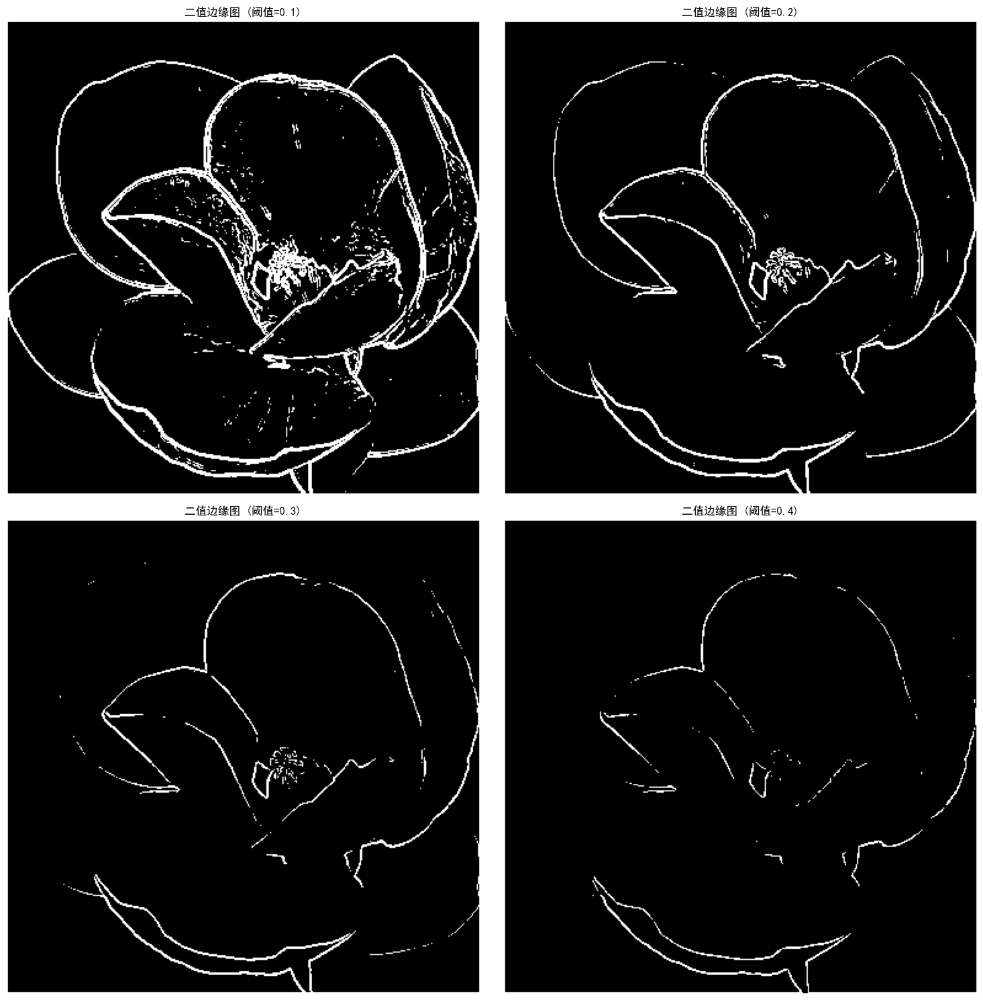

In [40]:
# 阈值化边缘检测
def threshold_edge_detection(magnitude, threshold=0.1):
    """
    对梯度幅值进行阈值化，得到二值边缘图像
    
    参数:
        magnitude: torch.Tensor, 梯度幅值 [H, W]
        threshold: float, 阈值，默认0.1
    
    返回:
        torch.Tensor, 二值边缘图像 [H, W]
    """
    # 归一化梯度幅值到[0, 1]
    magnitude_normalized = (magnitude - magnitude.min()) / (magnitude.max() - magnitude.min() + 1e-8)
    # 阈值化
    edges = (magnitude_normalized > threshold).float()
    return edges

# 比较不同阈值的效果
thresholds = [0.1, 0.2, 0.3, 0.4]
threshold_results = {}

for threshold in thresholds:
    edges = threshold_edge_detection(edge_magnitude, threshold=threshold)
    threshold_results[threshold] = edges
    print(f"阈值 {threshold:.1f}: 检测到 {edges.sum().item():.0f} 个边缘像素 "
          f"({edges.sum().item() / edges.numel() * 100:.2f}%)")

# 可视化不同阈值的效果
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes = axes.flatten()

img_np = img.permute(1, 2, 0).numpy()

for idx, threshold in enumerate(thresholds):
    ax = axes[idx]
    edges = threshold_results[threshold]
    edges_np = edges.numpy()
    
    # 叠加显示
    ax.imshow(img_np, alpha=0.7)
    ax.imshow(edges_np, cmap='hot', alpha=0.5)
    ax.set_title(f'阈值={threshold:.1f} ({edges.sum().item():.0f}个边缘像素)')
    ax.axis('off')

plt.tight_layout()
plt.show()

# 同时显示不同阈值的二值边缘图
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes = axes.flatten()

for idx, threshold in enumerate(thresholds):
    ax = axes[idx]
    edges = threshold_results[threshold]
    edges_np = edges.numpy()
    
    ax.imshow(edges_np, cmap='gray')
    ax.set_title(f'二值边缘图 (阈值={threshold:.1f})')
    ax.axis('off')

plt.tight_layout()
plt.show()


### 梯度方向可视化

梯度方向可以用于分析边缘的方向特征，不同方向可以用不同颜色表示。


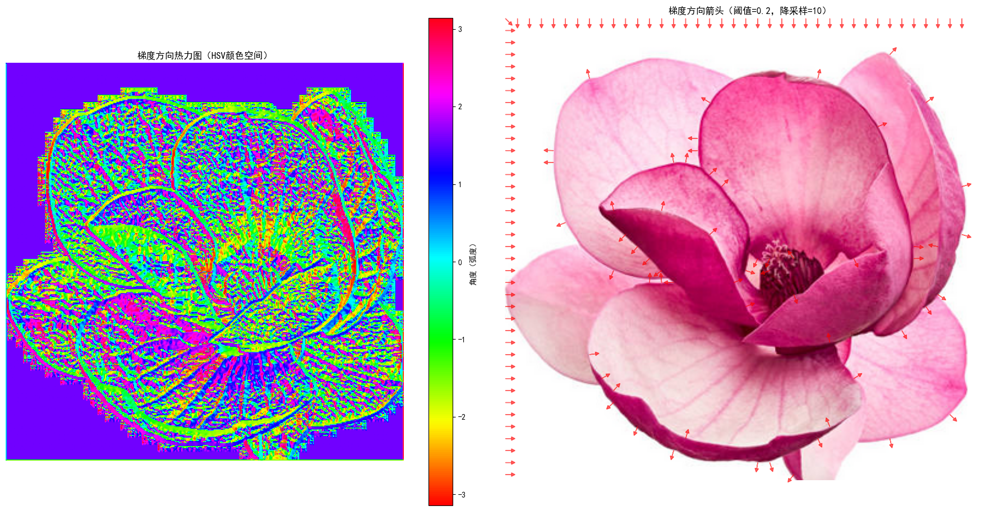

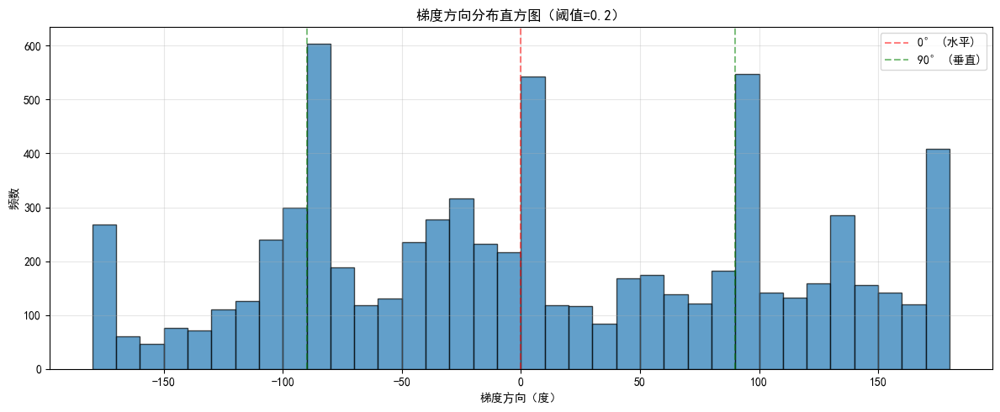

In [41]:
# 可视化梯度方向
def visualize_gradient_direction(img, magnitude, direction, threshold=0.1):
    """
    可视化梯度方向（在边缘强度足够的地方显示方向箭头）
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]
        magnitude: torch.Tensor, 梯度幅值 [H, W]
        direction: torch.Tensor, 梯度方向 [H, W]
        threshold: float, 显示箭头的阈值
    """
    img_np = img.permute(1, 2, 0).numpy()
    magnitude_np = magnitude.numpy()
    direction_np = direction.numpy()
    
    # 归一化梯度幅值
    magnitude_normalized = (magnitude_np - magnitude_np.min()) / (magnitude_np.max() - magnitude_np.min() + 1e-8)
    
    # 创建子图
    fig, axes = plt.subplots(1, 2, figsize=(18, 9))
    
    # 1. 梯度方向热力图
    im1 = axes[0].imshow(direction_np, cmap='hsv', vmin=-np.pi, vmax=np.pi)
    axes[0].set_title('梯度方向热力图（HSV颜色空间）')
    axes[0].axis('off')
    plt.colorbar(im1, ax=axes[0], label='角度（弧度）')
    
    # 2. 在原始图像上叠加方向箭头（降采样以提高可读性）
    axes[1].imshow(img_np)
    
    # 降采样因子（只显示部分箭头）
    downsample = 10
    h, w = magnitude_np.shape
    y_coords = np.arange(0, h, downsample)
    x_coords = np.arange(0, w, downsample)
    
    for y in y_coords:
        for x in x_coords:
            if magnitude_normalized[y, x] > threshold:
                # 计算箭头方向
                angle = direction_np[y, x]
                # 计算箭头端点
                dx = np.cos(angle) * downsample * 0.5
                dy = np.sin(angle) * downsample * 0.5
                # 绘制箭头
                axes[1].arrow(x, y, dx, dy, head_width=3, head_length=3, 
                            fc='red', ec='red', alpha=0.6, linewidth=1)
    
    axes[1].set_title(f'梯度方向箭头（阈值={threshold}，降采样={downsample}）')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # 分析梯度方向分布
    # 只统计边缘强度足够的地方的方向
    edge_mask = magnitude_normalized > threshold
    edge_directions = direction_np[edge_mask]
    
    if len(edge_directions) > 0:
        # 将角度转换为度数
        edge_directions_deg = np.degrees(edge_directions)
        
        # 可视化方向分布直方图
        plt.figure(figsize=(12, 5))
        plt.hist(edge_directions_deg, bins=36, range=(-180, 180), alpha=0.7, edgecolor='black')
        plt.xlabel('梯度方向（度）')
        plt.ylabel('频数')
        plt.title(f'梯度方向分布直方图（阈值={threshold}）')
        plt.axvline(x=0, color='r', linestyle='--', alpha=0.5, label='0° (水平)')
        plt.axvline(x=90, color='g', linestyle='--', alpha=0.5, label='90° (垂直)')
        plt.axvline(x=-90, color='g', linestyle='--', alpha=0.5)
        plt.legend()
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

# 可视化梯度方向
visualize_gradient_direction(img, edge_magnitude, edge_direction, threshold=0.2)


## 5. 与其他边缘检测算子的对比

Sobel算子是一种常用的边缘检测算子，但还有其他算子可供选择。每种算子都有其特点。


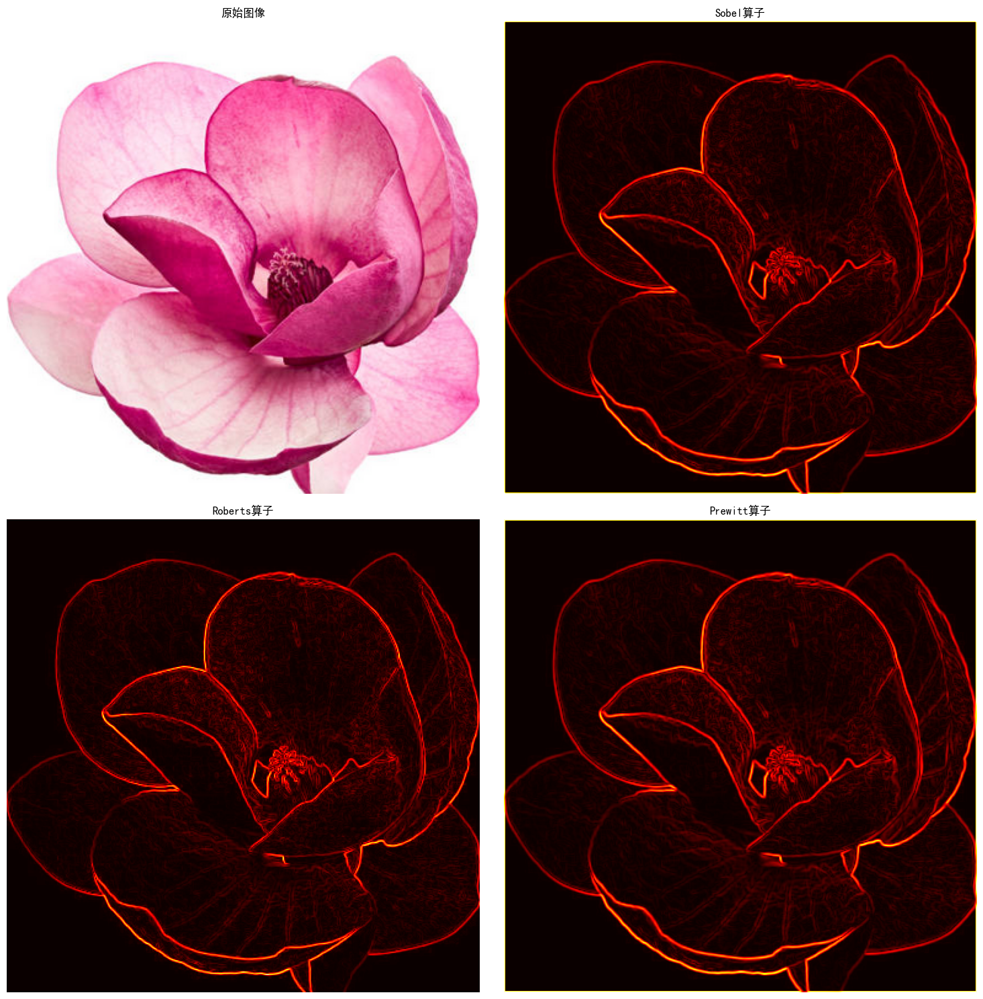

不同边缘检测算子的梯度幅值统计:
------------------------------------------------------------
算子                最小值        最大值        平均值        标准差
------------------------------------------------------------
Sobel          0.0000     4.2422     0.2099     0.4992
Roberts        0.0000     0.9418     0.0367     0.0701
Prewitt        0.0000     2.9997     0.1549     0.3707


In [42]:
# 实现其他边缘检测算子
def roberts_edge_detection(img):
    """Roberts边缘检测算子"""
    gray = rgb_to_grayscale(img).unsqueeze(0).unsqueeze(0)
    
    # Roberts算子（2x2）
    roberts_x = torch.tensor([[1, 0], [0, -1]], dtype=torch.float32).view(1, 1, 2, 2)
    roberts_y = torch.tensor([[0, 1], [-1, 0]], dtype=torch.float32).view(1, 1, 2, 2)
    
    grad_x = F.conv2d(gray, roberts_x, padding=0)
    grad_y = F.conv2d(gray, roberts_y, padding=0)
    
    magnitude = torch.sqrt(grad_x**2 + grad_y**2)
    return magnitude.squeeze()

def prewitt_edge_detection(img):
    """Prewitt边缘检测算子"""
    gray = rgb_to_grayscale(img).unsqueeze(0).unsqueeze(0)
    
    # Prewitt算子
    prewitt_x = torch.tensor([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=torch.float32).view(1, 1, 3, 3)
    prewitt_y = torch.tensor([[-1, -1, -1], [0, 0, 0], [1, 1, 1]], dtype=torch.float32).view(1, 1, 3, 3)
    
    grad_x = F.conv2d(gray, prewitt_x, padding=1)
    grad_y = F.conv2d(gray, prewitt_y, padding=1)
    
    magnitude = torch.sqrt(grad_x**2 + grad_y**2)
    return magnitude.squeeze()

# 应用不同的边缘检测算子
sobel_result = edge_magnitude
roberts_result = roberts_edge_detection(img)
prewitt_result = prewitt_edge_detection(img)

# 可视化对比
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

img_np = img.permute(1, 2, 0).numpy()

# 原始图像
axes[0, 0].imshow(img_np)
axes[0, 0].set_title('原始图像')
axes[0, 0].axis('off')

# Sobel算子
axes[0, 1].imshow(sobel_result.numpy(), cmap='hot')
axes[0, 1].set_title('Sobel算子')
axes[0, 1].axis('off')

# Roberts算子
axes[1, 0].imshow(roberts_result.numpy(), cmap='hot')
axes[1, 0].set_title('Roberts算子')
axes[1, 0].axis('off')

# Prewitt算子
axes[1, 1].imshow(prewitt_result.numpy(), cmap='hot')
axes[1, 1].set_title('Prewitt算子')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# 统计对比
print("不同边缘检测算子的梯度幅值统计:")
print("-" * 60)
print(f"{'算子':10s} {'最小值':>10s} {'最大值':>10s} {'平均值':>10s} {'标准差':>10s}")
print("-" * 60)
for name, result in [('Sobel', sobel_result), ('Roberts', roberts_result), ('Prewitt', prewitt_result)]:
    result_np = result.numpy()
    print(f"{name:10s} {result_np.min():>10.4f} {result_np.max():>10.4f} "
          f"{result_np.mean():>10.4f} {result_np.std():>10.4f}")


## 6. 边缘检测的应用场景

### 6.1 图像分割
- **物体轮廓提取**：通过边缘检测提取物体的轮廓
- **区域分割**：利用边缘信息将图像分割成不同区域
- **前景/背景分离**：通过边缘检测区分前景和背景

### 6.2 特征提取
- **形状描述**：通过边缘检测获取物体的形状特征
- **边缘特征**：边缘作为图像的重要特征用于识别
- **边界跟踪**：沿边缘进行边界跟踪

### 6.3 图像增强
- **边缘锐化**：通过边缘检测结果增强图像的边缘
- **细节增强**：突出图像的细节信息

### 6.4 计算机视觉应用
- **目标检测**：利用边缘信息进行目标检测
- **图像配准**：通过边缘匹配进行图像对齐
- **立体视觉**：在立体视觉中检测对应边缘

### 6.5 医学图像处理
- **组织边界检测**：检测医学图像中的组织边界
- **病灶识别**：通过边缘检测识别病灶区域

## 7. 边缘检测的改进方法

### 7.1 高斯滤波预处理

在边缘检测前进行高斯滤波可以降低噪声影响，提高检测效果。


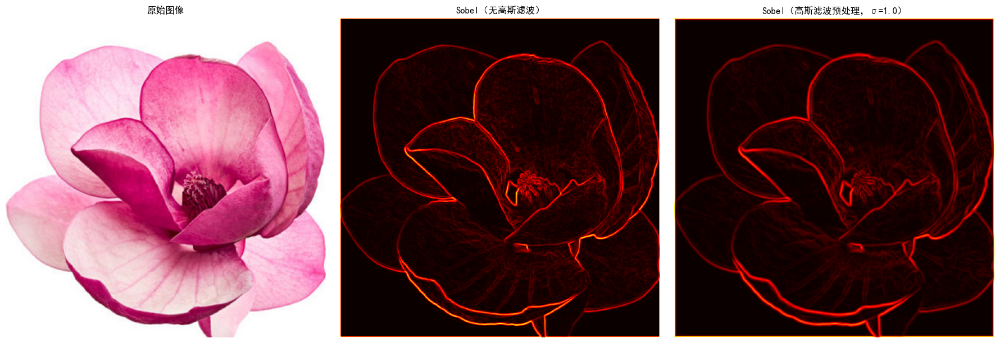

有无高斯滤波的对比:
--------------------------------------------------
无高斯滤波 - 梯度幅值范围: [0.0000, 4.2422]
有高斯滤波 - 梯度幅值范围: [0.0000, 3.7659]


In [43]:
# 带高斯滤波预处理的Sobel边缘检测
def sobel_edge_detection_with_gaussian(img, sigma=1.0):
    """
    使用高斯滤波预处理的Sobel边缘检测
    
    参数:
        img: torch.Tensor, RGB图像 [3, H, W]，值域[0, 1]
        sigma: float, 高斯滤波的标准差，默认1.0
    """
    # 转为灰度图
    gray = rgb_to_grayscale(img).unsqueeze(0).unsqueeze(0)  # [1, 1, H, W]
    
    # 创建高斯核
    kernel_size = int(6 * sigma + 1)
    if kernel_size % 2 == 0:
        kernel_size += 1
    
    x = torch.arange(kernel_size, dtype=torch.float32) - kernel_size // 2
    y = torch.arange(kernel_size, dtype=torch.float32) - kernel_size // 2
    xx, yy = torch.meshgrid(x, y, indexing='ij')
    gaussian_kernel = torch.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    gaussian_kernel = gaussian_kernel / gaussian_kernel.sum()
    gaussian_kernel = gaussian_kernel.view(1, 1, kernel_size, kernel_size)
    
    # 高斯滤波
    gray_smooth = F.conv2d(gray, gaussian_kernel, padding=kernel_size//2)
    
    # Sobel算子
    sobel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32).view(1, 1, 3, 3)
    sobel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32).view(1, 1, 3, 3)
    
    # 计算梯度
    grad_x = F.conv2d(gray_smooth, sobel_x, padding=1)
    grad_y = F.conv2d(gray_smooth, sobel_y, padding=1)
    
    # 计算梯度幅值
    magnitude = torch.sqrt(grad_x**2 + grad_y**2)
    
    return magnitude.squeeze()

# 对比有无高斯滤波的效果
sobel_no_gaussian = edge_magnitude
sobel_with_gaussian = sobel_edge_detection_with_gaussian(img, sigma=1.0)

# 可视化对比
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

img_np = img.permute(1, 2, 0).numpy()

# 原始图像
axes[0].imshow(img_np)
axes[0].set_title('原始图像')
axes[0].axis('off')

# 无高斯滤波
axes[1].imshow(sobel_no_gaussian.numpy(), cmap='hot')
axes[1].set_title('Sobel（无高斯滤波）')
axes[1].axis('off')

# 有高斯滤波
axes[2].imshow(sobel_with_gaussian.numpy(), cmap='hot')
axes[2].set_title('Sobel（高斯滤波预处理，σ=1.0）')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("有无高斯滤波的对比:")
print("-" * 50)
print(f"无高斯滤波 - 梯度幅值范围: [{sobel_no_gaussian.min().item():.4f}, {sobel_no_gaussian.max().item():.4f}]")
print(f"有高斯滤波 - 梯度幅值范围: [{sobel_with_gaussian.min().item():.4f}, {sobel_with_gaussian.max().item():.4f}]")


## 8. 总结

### Sobel边缘检测的特点：
- ✅ **优点**：
  - 计算简单高效，适合实时处理
  - 对垂直和水平边缘敏感
  - 可以同时得到边缘的强度和方向信息
  - 实现简单，应用广泛
- ❌ **缺点**：
  - 对噪声敏感（需要通过预处理改善）
  - 检测到的边缘可能较粗（需要细化处理）
  - 容易产生伪边缘
  - 只对特定方向的边缘敏感

### 不同边缘检测算子的特点对比：
- **Roberts算子**：
  - ✅ 计算最简单，实现容易
  - ❌ 抗噪声能力差，只检测45°和135°方向的边缘
- **Prewitt算子**：
  - ✅ 比Roberts抗噪声能力强
  - ❌ 对边缘的响应不如Sobel敏感
- **Sobel算子**：
  - ✅ 在精度和抗噪声之间取得平衡，最常用
  - ❌ 对噪声仍有一定敏感性
- **Canny算子**：
  - ✅ 效果最好，包括非极大值抑制和双阈值
  - ❌ 计算复杂，需要多个步骤

### 边缘检测 vs 其他特征检测方法：
- **颜色特征**：描述图像的色彩分布，对边缘信息不敏感
- **纹理特征**：描述图像的空间结构模式，包含边缘信息但不直接检测边缘
- **角点特征**：检测图像中的关键点，与边缘有关但关注的是点而非线
- **边缘特征**：直接检测图像的边缘，是图像的基本特征之一

### 最佳实践：
1. **预处理**：对噪声较大的图像进行高斯滤波预处理
2. **参数选择**：根据图像特点选择合适的阈值
   - 阈值过高：可能漏检弱边缘
   - 阈值过低：可能产生过多伪边缘
3. **算子选择**：根据应用场景选择合适的算子
   - 实时应用：选择Sobel或Prewitt
   - 高精度要求：选择Canny
4. **后处理**：使用非极大值抑制细化边缘，使用形态学操作去除噪声
5. **多尺度检测**：对于需要处理不同尺度图像的场景，可以使用多尺度边缘检测
6. **方向信息**：充分利用梯度方向信息，可以用于边缘跟踪和形状分析


---

# 深度学习特征提取

## 5. 深度学习特征提取

深度学习特征提取利用预训练的深度卷积神经网络（CNN）来提取图像的高级特征表示。这些特征具有强大的表达能力和泛化能力，在图像检索、分类、相似度匹配等任务中表现出色。

### 知识点梳理

**1. 深度学习特征提取的基本原理**
- **预训练模型**：使用在大型数据集（如ImageNet）上预训练的CNN模型
- **迁移学习**：利用预训练模型的知识来提取通用图像特征
- **层级特征**：
  - **低级特征**：边缘、纹理、颜色等基础特征
  - **中级特征**：形状、模式、部分对象等
  - **高级特征**：完整的对象、场景、语义信息
- **优点**：
  - 特征表达能力强，能够捕捉复杂的视觉模式
  - 对光照、旋转、缩放等变化具有良好的鲁棒性
  - 具有很好的泛化能力，适用于多种任务
- **缺点**：
  - 计算复杂度较高，需要GPU加速
  - 特征维度较高，需要降维处理
  - 对图像预处理要求较高

**2. 常用的预训练模型**
- **ResNet**：残差网络，解决了深层网络的退化问题
  - ResNet50、ResNet101等
  - 适合提取多层次的视觉特征
- **VGG**：深度卷积网络，结构简单清晰
  - VGG16、VGG19等
  - 特征提取效果稳定
- **其他模型**：AlexNet、GoogLeNet、EfficientNet等

**3. 特征提取策略**
- **全网络特征**：使用整个网络提取特征
- **中间层特征**：提取网络的中间层输出，保留更多空间信息
- **多尺度特征**：结合多个层的特征，获得更丰富的表示
- **全局特征**：使用全局平均池化或全连接层提取全局特征向量

**4. 特征融合**
- **颜色特征 + 深度特征**：结合传统特征和深度学习特征
- **多尺度特征融合**：融合不同层次的特征
- **特征归一化**：对不同类型的特征进行归一化处理


In [ ]:
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F

class FeatureExtractor(nn.Module):
    """
    深度学习特征提取器
    
    支持多种预训练模型的特征提取，可以从不同层提取特征
    """
    def __init__(self, model_name='resnet50', pretrained=True):
        """
        初始化特征提取器
        
        参数:
            model_name: str, 模型名称，支持 'resnet50', 'vgg16' 等
            pretrained: bool, 是否使用预训练权重，默认True
        """
        super().__init__()
        
        if model_name == 'resnet50':
            self.model = models.resnet50(pretrained=pretrained)
            # 移除最后的分类层
            self.model = nn.Sequential(*list(self.model.children())[:-2])
        elif model_name == 'vgg16':
            vgg = models.vgg16(pretrained=pretrained)
            # 只保留特征提取部分（features）
            self.model = vgg.features
        else:
            raise ValueError(f"不支持的模型: {model_name}")
        
        self.model_name = model_name
        
    def forward(self, x):
        """
        前向传播，提取特征
        
        参数:
            x: torch.Tensor, 输入图像 [B, C, H, W]
        
        返回:
            list of torch.Tensor, 各层的特征列表
        """
        if self.model_name == 'resnet50':
            # ResNet特征提取
            features = []
            x = self.model[0](x)  # conv1
            x = self.model[1](x)  # bn1
            x = self.model[2](x)  # relu
            x = self.model[3](x)  # maxpool
            
            x = self.model[4](x)  # layer1 - 低级特征
            features.append(x)
            x = self.model[5](x)  # layer2 - 中级特征
            features.append(x)
            x = self.model[6](x)  # layer3 - 中高级特征
            features.append(x)
            x = self.model[7](x)  # layer4 - 高级特征
            features.append(x)
            
            return features
            
        elif self.model_name == 'vgg16':
            # VGG特征提取
            features = []
            for i, layer in enumerate(self.model):
                x = layer(x)
                # 提取不同池化层后的特征
                if isinstance(layer, nn.MaxPool2d):
                    features.append(x)
            return features

# 应用示例
def extract_deep_features(img_tensor, model_name='resnet50'):
    """
    提取深度学习特征
    
    参数:
        img_tensor: torch.Tensor, 输入图像 [3, H, W]，值域[0, 1]
        model_name: str, 模型名称，默认'resnet50'
    
    返回:
        list of torch.Tensor, 各层的特征列表
    """
    extractor = FeatureExtractor(model_name=model_name, pretrained=True)
    extractor.eval()
    
    # 图像预处理（ImageNet标准化）
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    
    # 确保输入是[3, H, W]格式
    if img_tensor.dim() == 3:
        img_processed = transform(img_tensor).unsqueeze(0)  # [1, 3, 224, 224]
    else:
        img_processed = transform(img_tensor)
    
    with torch.no_grad():
        features = extractor(img_processed)
    
    return features, extractor

# 使用示例
try:
    deep_features, extractor = extract_deep_features(img, model_name='resnet50')
    print(f"提取到 {len(deep_features)} 个层次的特征")
    for i, feat in enumerate(deep_features):
        print(f"第{i+1}层特征形状: {feat.shape}")  # [B, C, H, W]
except Exception as e:
    print(f"特征提取出错: {e}")
    print("可能需要下载预训练模型，请确保网络连接正常")


## 6. 卷积特征可视化

通过可视化卷积层的特征图，可以理解CNN模型是如何"看"图像的，以及不同层学习到的特征模式。


In [ ]:
def visualize_conv_features(model, img_tensor, layer_idx=0, num_features=16):
    """
    可视化卷积层的特征图
    
    参数:
        model: torch.nn.Module, 预训练的CNN模型
        img_tensor: torch.Tensor, 输入图像 [3, H, W]，值域[0, 1]
        layer_idx: int, 要可视化的层索引
        num_features: int, 显示的特征图数量，默认16
    """
    # 图像预处理
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    
    img_processed = transform(img_tensor).unsqueeze(0)
    
    # 注册钩子获取中间层输出
    features = []
    def hook_fn(module, input, output):
        features.append(output.detach())
    
    # 注册钩子到指定层
    if isinstance(model, models.ResNet):
        # ResNet模型
        if layer_idx == 0:
            handle = model.layer1[0].conv1.register_forward_hook(hook_fn)
        elif layer_idx == 1:
            handle = model.layer2[0].conv1.register_forward_hook(hook_fn)
        elif layer_idx == 2:
            handle = model.layer3[0].conv1.register_forward_hook(hook_fn)
        elif layer_idx == 3:
            handle = model.layer4[0].conv1.register_forward_hook(hook_fn)
        else:
            handle = model.layer1[0].conv1.register_forward_hook(hook_fn)
    elif isinstance(model, models.VGG):
        # VGG模型
        conv_layers = [i for i, m in enumerate(model.features) if isinstance(m, nn.Conv2d)]
        if layer_idx < len(conv_layers):
            handle = model.features[conv_layers[layer_idx]].register_forward_hook(hook_fn)
        else:
            handle = model.features[conv_layers[0]].register_forward_hook(hook_fn)
    else:
        raise ValueError("不支持的模型类型")
    
    # 前向传播
    model.eval()
    with torch.no_grad():
        _ = model(img_processed)
    
    # 移除钩子
    handle.remove()
    
    # 可视化特征图
    if len(features) > 0:
        feature_maps = features[0].squeeze(0)  # [C, H, W]
        num_features = min(num_features, feature_maps.size(0))
        
        plt.figure(figsize=(15, 15))
        for i in range(num_features):
            plt.subplot(4, 4, i+1)
            feat_map = feature_maps[i].cpu().numpy()
            # 归一化到[0, 1]用于显示
            feat_map = (feat_map - feat_map.min()) / (feat_map.max() - feat_map.min() + 1e-8)
            plt.imshow(feat_map, cmap='viridis')
            plt.axis('off')
            plt.title(f'Feature Map {i+1}')
        plt.suptitle(f'第{layer_idx+1}层卷积特征图', fontsize=16)
        plt.tight_layout()
        plt.show()
    else:
        print("未能提取到特征图")

# 可视化不同层的特征
try:
    model = models.resnet50(pretrained=True)
    model.eval()
    
    # 可视化第一层的特征
    print("可视化ResNet Layer1的特征图:")
    visualize_conv_features(model, img, layer_idx=0, num_features=16)
except Exception as e:
    print(f"特征可视化出错: {e}")
    print("可能需要下载预训练模型，请确保网络连接正常")


### 多尺度特征可视化

不同层的特征图捕捉了不同尺度的信息。通过对比不同层的特征，可以理解CNN的层次化学习过程。


In [ ]:
# 提取和可视化多层特征
def visualize_multilayer_features(img_tensor, model_name='resnet50'):
    """
    可视化多个层的特征图，展示不同层学习到的特征
    """
    features, extractor = extract_deep_features(img_tensor, model_name=model_name)
    
    # 可视化每层的特征（降采样以适合显示）
    num_layers = len(features)
    fig, axes = plt.subplots(1, num_layers, figsize=(18, 4))
    
    layer_names = ['Layer1\n(低级特征)', 'Layer2\n(中级特征)', 
                   'Layer3\n(中高级特征)', 'Layer4\n(高级特征)']
    
    for idx, (feat, ax) in enumerate(zip(features, axes)):
        # 取第一个batch，对通道维度求平均
        feat_avg = feat[0].mean(dim=0).cpu().numpy()
        
        # 归一化
        feat_avg = (feat_avg - feat_avg.min()) / (feat_avg.max() - feat_avg.min() + 1e-8)
        
        ax.imshow(feat_avg, cmap='viridis')
        ax.set_title(layer_names[idx] if idx < len(layer_names) else f'Layer{idx+1}')
        ax.axis('off')
    
    plt.suptitle('不同层的特征图对比', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # 打印特征统计信息
    print("\n各层特征统计:")
    print("-" * 60)
    print(f"{'层':10s} {'形状':20s} {'通道数':>10s} {'空间尺寸':>15s}")
    print("-" * 60)
    for i, feat in enumerate(features):
        b, c, h, w = feat.shape
        print(f"Layer{i+1}  {str(feat.shape):20s} {c:>10d} {h}x{w:>10d}")

# 可视化多层特征
try:
    visualize_multilayer_features(img, model_name='resnet50')
except Exception as e:
    print(f"多层特征可视化出错: {e}")


## 7. 图像检索示例 - 基于颜色和深度特征

图像检索是深度学习特征的重要应用之一。通过结合传统特征（如颜色直方图）和深度学习特征，可以构建更强大的图像检索系统。


In [ ]:
class ImageRetrievalSystem:
    """
    图像检索系统
    
    结合颜色特征和深度学习特征进行图像检索
    """
    def __init__(self, model_name='resnet50'):
        """
        初始化检索系统
        
        参数:
            model_name: str, 使用的深度学习模型名称
        """
        self.feature_extractor = FeatureExtractor(model_name=model_name, pretrained=True)
        self.feature_extractor.eval()
        self.model_name = model_name
        self.image_features = []
        self.image_paths = []
        
    def extract_features(self, img_tensor):
        """
        提取图像的特征向量
        
        参数:
            img_tensor: torch.Tensor, 输入图像 [3, H, W]，值域[0, 1]
        
        返回:
            torch.Tensor, 特征向量
        """
        # 1. 提取颜色特征（归一化RGB直方图）
        color_feat = normalized_color_histogram(img_tensor, bins=32).flatten()  # 96维
        
        # 2. 提取深度特征
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])
        
        img_processed = transform(img_tensor).unsqueeze(0)
        
        with torch.no_grad():
            deep_feats = self.feature_extractor(img_processed)
            # 使用最后一层特征，全局平均池化
            deep_feat = deep_feats[-1]  # [1, C, H, W]
            deep_feat = F.adaptive_avg_pool2d(deep_feat, (1, 1))  # 全局平均池化
            deep_feat = deep_feat.squeeze().flatten()  # [C]
        
        # 3. 特征归一化
        color_feat_norm = F.normalize(color_feat.unsqueeze(0), p=2, dim=1).squeeze()
        deep_feat_norm = F.normalize(deep_feat.unsqueeze(0), p=2, dim=1).squeeze()
        
        # 4. 特征融合（加权组合）
        alpha = 0.3  # 颜色特征权重
        beta = 0.7   # 深度特征权重
        combined_feat = alpha * color_feat_norm + beta * deep_feat_norm
        
        return combined_feat
    
    def add_image(self, img_tensor, img_path='unknown'):
        """
        添加图像到检索库
        
        参数:
            img_tensor: torch.Tensor, 输入图像
            img_path: str, 图像路径标识
        """
        feat = self.extract_features(img_tensor)
        self.image_features.append(feat)
        self.image_paths.append(img_path)
        print(f"已添加图像: {img_path}, 特征维度: {feat.shape}")
    
    def search_similar(self, query_img, top_k=5):
        """
        搜索相似图像
        
        参数:
            query_img: torch.Tensor, 查询图像
            top_k: int, 返回最相似的图像数量
        
        返回:
            list, 最相似的图像路径列表
            list, 相似度分数列表
        """
        query_feat = self.extract_features(query_img)
        
        # 计算相似度（余弦相似度）
        similarities = []
        for feat in self.image_features:
            # 归一化特征
            query_feat_norm = F.normalize(query_feat.unsqueeze(0), p=2, dim=1)
            feat_norm = F.normalize(feat.unsqueeze(0), p=2, dim=1)
            # 余弦相似度
            sim = F.cosine_similarity(query_feat_norm, feat_norm)
            similarities.append(sim.item())
        
        # 返回最相似的图像
        similarities_tensor = torch.tensor(similarities)
        top_k_indices = torch.topk(similarities_tensor, min(top_k, len(similarities))).indices
        
        results = [(self.image_paths[i], similarities[i]) for i in top_k_indices]
        return results

# 使用示例
try:
    # 创建检索系统
    retrieval_system = ImageRetrievalSystem(model_name='resnet50')
    
    # 添加图像到检索库（这里用同一张图作为示例）
    retrieval_system.add_image(img, 'query_image.jpg')
    
    # 搜索相似图像
    similar_images = retrieval_system.search_similar(img, top_k=5)
    
    print("\n相似图像检索结果:")
    print("-" * 50)
    for i, (path, sim) in enumerate(similar_images):
        print(f"排名{i+1}: {path}, 相似度: {sim:.4f}")
except Exception as e:
    print(f"图像检索系统出错: {e}")
    print("可能需要下载预训练模型，请确保网络连接正常")


### 特征提取和检索流程可视化

通过可视化特征提取过程，可以更好地理解图像检索系统的工作原理。


In [ ]:
# 可视化特征提取和检索过程
def visualize_feature_extraction(img_tensor):
    """
    可视化特征提取过程
    """
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # 1. 原始图像
    img_np = img_tensor.permute(1, 2, 0).numpy()
    axes[0, 0].imshow(img_np)
    axes[0, 0].set_title('原始图像')
    axes[0, 0].axis('off')
    
    # 2. 颜色特征（RGB直方图）
    color_hist = normalized_color_histogram(img_tensor, bins=32)
    axes[0, 1].plot(color_hist[0].numpy(), color='red', alpha=0.7, label='R')
    axes[0, 1].plot(color_hist[1].numpy(), color='green', alpha=0.7, label='G')
    axes[0, 1].plot(color_hist[2].numpy(), color='blue', alpha=0.7, label='B')
    axes[0, 1].set_title('颜色特征（RGB直方图）')
    axes[0, 1].set_xlabel('Bin')
    axes[0, 1].set_ylabel('概率')
    axes[0, 1].legend()
    axes[0, 1].grid(alpha=0.3)
    
    # 3. 深度学习特征（最后一层的特征图平均）
    try:
        features, _ = extract_deep_features(img_tensor, model_name='resnet50')
        deep_feat_avg = features[-1][0].mean(dim=0).cpu().numpy()
        axes[0, 2].imshow(deep_feat_avg, cmap='viridis')
        axes[0, 2].set_title('深度特征（Layer4平均特征图）')
        axes[0, 2].axis('off')
    except:
        axes[0, 2].text(0.5, 0.5, '深度特征提取失败', 
                       ha='center', va='center', transform=axes[0, 2].transAxes)
        axes[0, 2].axis('off')
    
    # 4. 特征向量可视化（降维后的2D可视化）
    try:
        retrieval_system = ImageRetrievalSystem(model_name='resnet50')
        feat_vector = retrieval_system.extract_features(img_tensor)
        
        # 使用PCA降维到2D用于可视化
        from sklearn.decomposition import PCA
        feat_2d = feat_vector.unsqueeze(0).numpy()
        if feat_2d.shape[1] > 2:
            pca = PCA(n_components=2)
            feat_2d = pca.fit_transform(feat_2d)
        
        axes[1, 0].scatter(feat_2d[0, 0], feat_2d[0, 1], s=200, c='red', alpha=0.7)
        axes[1, 0].set_title('特征向量（PCA降维到2D）')
        axes[1, 0].set_xlabel('PC1')
        axes[1, 0].set_ylabel('PC2')
        axes[1, 0].grid(alpha=0.3)
        
        # 5. 特征向量分布
        feat_np = feat_vector.numpy()
        axes[1, 1].plot(feat_np[:100], alpha=0.7)  # 只显示前100维
        axes[1, 1].set_title('特征向量分布（前100维）')
        axes[1, 1].set_xlabel('特征维度')
        axes[1, 1].set_ylabel('特征值')
        axes[1, 1].grid(alpha=0.3)
        
        # 6. 特征统计信息
        axes[1, 2].axis('off')
        stats_text = f"""
        特征统计信息:
        - 特征维度: {feat_vector.shape[0]}
        - 特征范围: [{feat_vector.min():.4f}, {feat_vector.max():.4f}]
        - 特征均值: {feat_vector.mean():.4f}
        - 特征标准差: {feat_vector.std():.4f}
        - 特征L2范数: {torch.norm(feat_vector).item():.4f}
        """
        axes[1, 2].text(0.1, 0.5, stats_text, fontsize=12, 
                       verticalalignment='center', family='monospace')
        axes[1, 2].set_title('特征统计')
    except Exception as e:
        axes[1, 0].text(0.5, 0.5, f'特征提取失败:\n{str(e)}', 
                       ha='center', va='center', transform=axes[1, 0].transAxes)
        axes[1, 0].axis('off')
    
    plt.tight_layout()
    plt.show()

# 可视化特征提取过程
try:
    visualize_feature_extraction(img)
except Exception as e:
    print(f"可视化出错: {e}")


## 8. 深度学习特征的应用场景

### 8.1 图像检索
- **基于内容的图像检索（CBIR）**：通过深度学习特征找到相似图像
- **商品搜索**：电商平台的"以图搜图"功能
- **医学图像检索**：在医学图像数据库中检索相似病例

### 8.2 图像分类
- **场景分类**：识别图像场景（室内/室外、城市/自然等）
- **物体识别**：识别图像中的主要物体
- **细粒度分类**：区分相似类别的物体（如不同品种的鸟类）

### 8.3 图像相似度匹配
- **人脸识别**：比较人脸特征的相似度
- **产品匹配**：匹配相同或相似的产品
- **重复图像检测**：检测图像数据库中的重复图像

### 8.4 特征迁移
- **风格迁移**：利用特征进行图像风格转换
- **图像生成**：作为生成模型的输入特征
- **图像编辑**：基于特征进行图像编辑和增强

## 9. 总结

### 深度学习特征提取的特点：
- ✅ **优点**：
  - 特征表达能力强，能够捕捉复杂的视觉模式
  - 对光照、旋转、缩放等变化具有良好的鲁棒性
  - 具有很好的泛化能力，适用于多种任务
  - 可以自动学习层次化的特征表示
- ❌ **缺点**：
  - 计算复杂度较高，需要GPU加速
  - 特征维度较高，需要降维处理
  - 对图像预处理要求较高（需要归一化到特定范围）
  - 需要大量的预训练数据

### 传统特征 vs 深度学习特征：
| 特征类型 | 优点 | 缺点 | 适用场景 |
|---------|------|------|---------|
| **颜色特征** | 计算简单、直观 | 对光照敏感 | 简单检索任务 |
| **纹理特征** | 描述空间结构 | 计算复杂、对噪声敏感 | 材质识别 |
| **角点特征** | 对几何变换鲁棒 | 对尺度敏感 | 特征匹配 |
| **边缘特征** | 计算简单 | 对噪声敏感 | 边缘检测 |
| **深度学习特征** | 表达能力强、泛化好 | 计算复杂、需要GPU | 复杂检索、分类 |

### 特征融合策略：
1. **早期融合**：在特征提取阶段融合多种特征
2. **晚期融合**：分别提取特征后再融合
3. **加权融合**：根据特征重要性设置权重
4. **学习融合**：使用神经网络学习最优融合方式

### 最佳实践：
1. **模型选择**：根据任务选择合适的预训练模型
   - 图像分类：ResNet、EfficientNet
   - 目标检测：Faster R-CNN、YOLO
   - 语义分割：DeepLab、U-Net
2. **特征选择**：选择合适的层提取特征
   - 低级特征：保留更多空间信息
   - 高级特征：包含更多语义信息
3. **特征降维**：使用PCA、t-SNE等方法降维
4. **特征归一化**：对特征进行L2归一化，提高相似度计算的稳定性
5. **特征融合**：结合传统特征和深度学习特征，获得更好的效果
6. **高效检索**：使用近似最近邻（ANN）算法加速大规模检索
